***

### Name: Prashant Uttam Wakchaure 

***

## Feature attributes:

| Attributes | DataType | Description |
| --- | --- | --- |
| <b>id</b>  | int64 | unique identifier |
| <b>thoroughfare_id</b> | int64 | thoroughfare unique identifier |
| <b>census2016_settlement_geogid</b> | float64 | census settlement unique identifier |
| <b>census2016_small_area_geogid</b> | object | census small area unique identifier |
| <b>local_authority_id</b> | int64 | local authorithy unique identifier |
| <b>post_county_name</b> | object | county name |
| <b>eircode_area_code</b> | object | eircode area |
| <b>postal_address</b> | object | address of the subject property |
| <b>new_home_ind</b> | int64 | new home indicator. 1 means Yes. 0 means No |
| <b>sold_date</b> | object | sold date |
| <b>lat</b> | float64 | latitude of the subject property |
| <b>lon</b> | float64 | longitude of the subject property |
| <b>building_property_subtype_code</b> | object | property type |
| <b>building_shape_area_value</b> | float64 | footprint in meters of the subject property |
| <b>sqm_value</b> | float64 | sq.meters value |
| <b>yoc_value</b> | float64 | year of construction |
| <b>storey_value</b> | float64 | storey's |
| <b>beds_value</b> | float64 | no. of bedrooms |
| <b>baths_value</b> | float64 | no. of bathrooms |

## Target:

| Attributes | DataType | Description |
| --- | --- | --- |
| <b>sold_price</b>  | int64 | sold price |

### Imports:

<p style="text-align:justify; color:red"><b>
Please install the required libraries, if any import is not found using pip install "missing_library". Also, run the notebook from the start to see all the images if they are not visible since I have used plotly.
    </b></p>

In [1]:
#Dataset handling
import openpyxl
import pandas as pd
from IPython.display import display

#Numericals & stats
import numpy as np 
import collections
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
import statsmodels.api as sm
from scipy import stats
import scipy.stats as stats
from scipy.stats import norm

#Visualizations
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
import plotly.figure_factory as ff
from plotly.subplots import make_subplots

#Missing values
from sklearn.impute import KNNImputer

#feature scaling
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler, KBinsDiscretizer

#feature splitting
from sklearn import preprocessing

#Regression algorithms
from sklearn.tree import DecisionTreeRegressor
import xgboost as xgb
from catboost import Pool
from sklearn.svm import SVR
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
from sklearn.naive_bayes import GaussianNB
from mlxtend.regressor import StackingRegressor
from sklearn.linear_model import LinearRegression, BayesianRidge, Lasso
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.base import BaseEstimator, TransformerMixin, RegressorMixin, clone

#Feature Selection
from sklearn.feature_selection import SelectFromModel, mutual_info_regression, VarianceThreshold

#Model Selection
from sklearn.model_selection import KFold,cross_val_score, RepeatedKFold, train_test_split

#Metrics
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, median_absolute_error, mean_squared_log_error

#Encoding
from sklearn.preprocessing import LabelEncoder

#Deep Learning Models
import keras
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LeakyReLU,PReLU,ELU
from keras.layers import Dropout

<img src="https://miro.medium.com/max/3870/1*eE8DP4biqtaIK3aIy1S2zA.png" alt="Data Science Cycle">


#### <center><h2> <font color='green'> Loading Data into Dataframe</font> </h2> </center>

<p style="text-align:justify;"><b>
As the dataset is in .xlsx and for some reason I was getting an XLRD error by using pd.read_excel, so I used openpyxl library to load the workbook and further save it as a .csv. 
    </b></p>

In [2]:
wb = openpyxl.load_workbook('dataset.xlsx')
sheet = wb.worksheets[0]

df = pd.DataFrame(sheet.values)
df.columns = df.iloc[0]
df = df[1:]

df.to_csv("dataset.csv", index=False)

In [3]:
pd.options.display.max_columns = None #display all the columns into the output cell.
pd.options.display.max_rows = None #display all the rows into the output cell.

In [4]:
missing_values = ["n/a", "na", "--", "?", " ", " ?","NULL"]

df_org = pd.read_csv("dataset.csv", na_values=missing_values)

In [5]:
df_org.head()

,id,thoroughfare_id,census2016_settlement_geogid,census2016_small_area_geogid,local_authority_id,post_county_name,eircode_area_code,postal_address,new_home_ind,sold_date,sold_price,lat,lon,building_property_subtype_code,building_shape_area_value,sqm_value,yoc_value,storey_value,beds_value,baths_value
0,432259,1200015895,35001.0,A268003007,29,dublin,D07,apartment 183 the spinnaker arran quay dublin ...,0,2015-08-24 00:00:00,165000,53.346098,-6.276856,multi-family,NaN,NaN,1993.0,1.0,1.0,NaN
1,679044,1200045364,4009.0,A267111010,27,dublin,D13,3 the green station manor dublin 13 d13 v1dv,1,2018-11-20 00:00:00,547577,53.419113,-6.149744,mid-terrace,66.594153,NaN,2017.0,NaN,NaN,NaN
2,1322973,1200010380,35001.0,A267024001,28,dublin,A94,1 rockford terrace deansgrange road deansgrang...,0,2016-06-21 00:00:00,443750,53.288762,-6.168170,mid-terrace,69.189807,NaN,NaN,NaN,NaN,NaN
3,28508,1200000258,35001.0,A267017013,28,dublin,A94,59 the beeches monkstown valley monkstown blac...,0,2018-07-20 00:00:00,417000,53.291416,-6.160378,semidetached,NaN,NaN,NaN,NaN,NaN,NaN
4,148784,1200007329,35001.0,A268149001,29,dublin,D08,flat 1 41 victoria quay dublin 8 d08 nf2w,0,2018-06-20 00:00:00,250000,53.346391,-6.284521,multi-family,NaN,NaN,NaN,1.0,NaN,NaN


<p style="text-align:justify;"><b>
We should always create a copy of the dataframe and use that copy further in order to retrieve anything from the original unprocessed dataframe. 
    </b></p>

In [6]:
df = df_org.copy()

#### <center><h2> <font color='green'> Data Preprocessing, Visualization and Exploration </font> </h2> </center>

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2500 entries, 0 to 2499
Data columns (total 20 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              2500 non-null   int64  
 1   thoroughfare_id                 2500 non-null   int64  
 2   census2016_settlement_geogid    2482 non-null   float64
 3   census2016_small_area_geogid    2500 non-null   object 
 4   local_authority_id              2500 non-null   int64  
 5   post_county_name                2500 non-null   object 
 6   eircode_area_code               2500 non-null   object 
 7   postal_address                  2500 non-null   object 
 8   new_home_ind                    2500 non-null   int64  
 9   sold_date                       2500 non-null   object 
 10  sold_price                      2500 non-null   int64  
 11  lat                             2500 non-null   float64
 12  lon                             25

<h3><center style="color: blue;"><b>Dropping unnecessary columns </b> </center></h3>

<p style="text-align:justify;"><b>
Herein, we will drop the unnecessary columns which are 'id', 'thoroughfare_id', 'postal_address','census2016_settlement_geogid'. These columns are having all unique values and will thus not add much to the regressive model.
    </b></p>

In [8]:
columns_to_drop = ['id', 'thoroughfare_id', 'postal_address','census2016_settlement_geogid','census2016_small_area_geogid','local_authority_id']

df.drop(columns_to_drop, axis=1, inplace=True)

In [9]:
df.head()

,post_county_name,eircode_area_code,new_home_ind,sold_date,sold_price,lat,lon,building_property_subtype_code,building_shape_area_value,sqm_value,yoc_value,storey_value,beds_value,baths_value
0,dublin,D07,0,2015-08-24 00:00:00,165000,53.346098,-6.276856,multi-family,NaN,NaN,1993.0,1.0,1.0,NaN
1,dublin,D13,1,2018-11-20 00:00:00,547577,53.419113,-6.149744,mid-terrace,66.594153,NaN,2017.0,NaN,NaN,NaN
2,dublin,A94,0,2016-06-21 00:00:00,443750,53.288762,-6.168170,mid-terrace,69.189807,NaN,NaN,NaN,NaN,NaN
3,dublin,A94,0,2018-07-20 00:00:00,417000,53.291416,-6.160378,semidetached,NaN,NaN,NaN,NaN,NaN,NaN
4,dublin,D08,0,2018-06-20 00:00:00,250000,53.346391,-6.284521,multi-family,NaN,NaN,NaN,1.0,NaN,NaN


<h3><center style="color: blue;"><b> Extracting and Integrating Dirty Data </b> </center></h3>

In [10]:
# semidetached category has multiple names, so we club them together with the "semidetached category"
df['building_property_subtype_code'].value_counts()

multi-family     1115
mid-terrace       687
end-terrace       318
semidetached      289
terraced           60
bungalow           28
SEMI_DETACHED       1
SEMIDETACHED        1
semi-detached       1
Name: building_property_subtype_code, dtype: int64

In [11]:
df['building_property_subtype_code'] = df['building_property_subtype_code'].str.replace('SEMIDETACHED', 'semidetached')
df['building_property_subtype_code'] = df['building_property_subtype_code'].str.replace('semi-detached', 'semidetached')
df['building_property_subtype_code'] = df['building_property_subtype_code'].str.replace('SEMI_DETACHED', 'semidetached')

In [12]:
df['building_property_subtype_code'].value_counts()

multi-family    1115
mid-terrace      687
end-terrace      318
semidetached     292
terraced          60
bungalow          28
Name: building_property_subtype_code, dtype: int64

In [13]:
df['sqm_value'] = df['sqm_value'].replace(-1.0, np.nan)

In [14]:
# We get the year, month and day from the datetime column
df['sold_date'] = df['sold_date'].str[:10]

df['sold_date'] = pd.to_datetime(df['sold_date'], format='%Y/%m/%d')

df['year_sold'] = df['sold_date'].dt.year
df['month_sold'] = df['sold_date'].dt.month
df['day_sold'] = df['sold_date'].dt.day

df.drop('sold_date', axis=1, inplace=True)

<h3><center style="color: blue;"><b>Handling Null Values </b> </center></h3>

In [15]:
missing_data = pd.DataFrame({'total_missing': df.isnull().sum(axis = 0).sort_values(ascending= False), 
                             'perc_missing': df.isnull().sum(axis = 0).sort_values(ascending= False) 
                             / len(df) * 100})
missing_data 

,total_missing,perc_missing
baths_value,1987,79.48
building_shape_area_value,1446,57.84
beds_value,1181,47.24
sqm_value,890,35.60
yoc_value,528,21.12
storey_value,287,11.48
day_sold,0,0.00
month_sold,0,0.00
year_sold,0,0.00
building_property_subtype_code,0,0.00


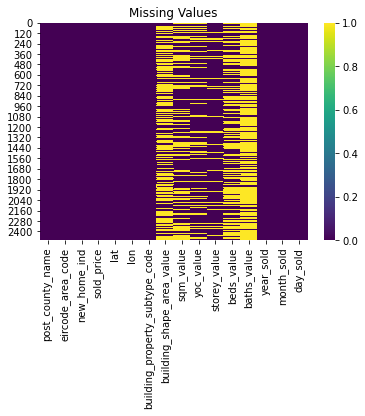

In [16]:
sns.heatmap(df.isnull(), cmap='viridis')
plt.title("Missing Values")
plt.show()

### Since they are many missing values, we need to find the relationship between missing values and sold_price

Let's plot some diagram for this relationship


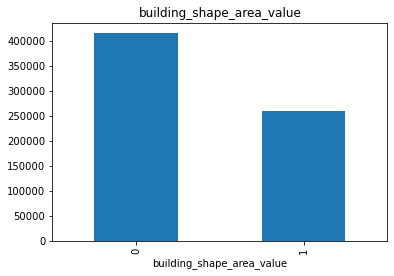

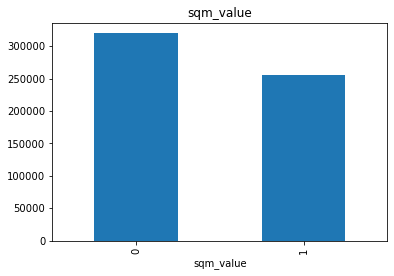

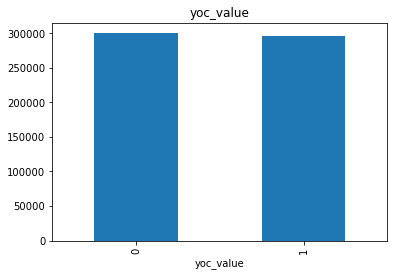

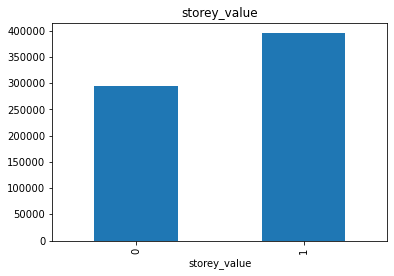

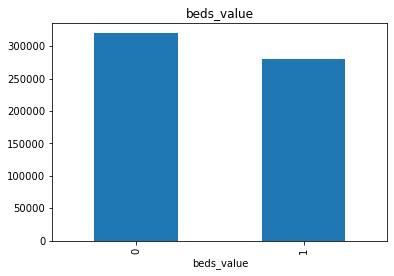

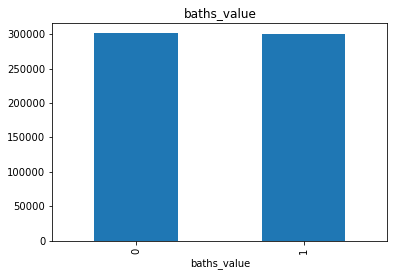

In [17]:
features_with_na=[features for features in df.columns if df[features].isnull().sum()>1]

for feature in features_with_na:
    data = df.copy()
    
    # let's make a variable that indicates 1 if the observation was missing or zero otherwise
    data[feature] = np.where(data[feature].isnull(), 1, 0)
    
    # let's calculate the median SalePrice where the information is missing or present
    data.groupby(feature)['sold_price'].median().plot.bar()
    plt.title(feature)
    plt.show()

<p style="text-align:justify;"><b>
Here with the relation between the missing values and the dependent variable is clearly visible. So, we need to replace these nan values with something meaningful. So, we use KNNImputer with 5 neighbors.
    </b></p>

In [18]:
# imputer to fill missing values
impute_variables = ['building_shape_area_value','sqm_value','yoc_value','storey_value','beds_value','baths_value']
KNN = KNNImputer(n_neighbors=5)

imputed_df1 = KNN.fit_transform(df[impute_variables])

imputed_df1 = pd.DataFrame(imputed_df1, columns = (impute_variables))

df[impute_variables] = imputed_df1[impute_variables]

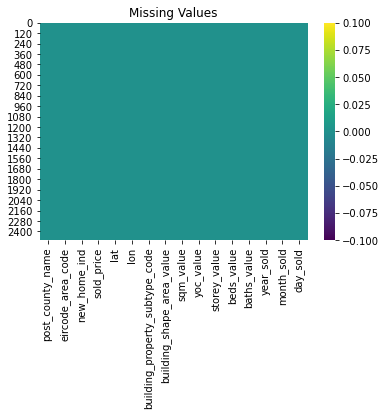

In [19]:
sns.heatmap(df.isnull(), cmap='viridis')
plt.title("Missing Values")
plt.show()

<p style="text-align:justify;"><b>
After imputation, we see that there are no more missing values in the dataset.
    </b></p>

In [20]:
df[df['yoc_value'] > df['year_sold']]

,post_county_name,eircode_area_code,new_home_ind,sold_price,lat,lon,building_property_subtype_code,building_shape_area_value,sqm_value,yoc_value,storey_value,beds_value,baths_value,year_sold,month_sold,day_sold
14,dublin,D04,0,235000,53.339537,-6.235630,multi-family,80.116808,73.380000,2018.0,1.0,2.0,1.2,2013,9,27
90,dublin,D07,0,207000,53.349973,-6.273800,multi-family,142.225187,57.780000,2018.0,1.0,1.4,0.8,2016,7,5
118,dublin,D04,0,240000,53.336452,-6.231983,multi-family,108.442076,63.423999,2016.0,1.0,1.6,0.8,2012,11,8
143,dublin,D07,0,300000,53.347131,-6.284630,terraced,73.071754,92.422000,2018.0,1.0,1.4,1.2,2017,4,13
243,dublin,D24,0,168000,53.282499,-6.360525,multi-family,127.658172,55.023999,2017.0,1.0,1.8,1.0,2016,12,16
557,dublin,D07,0,140000,53.350886,-6.274418,multi-family,142.225187,57.780000,2018.0,1.0,1.4,0.8,2015,8,31
704,dublin,D04,0,330000,53.339537,-6.235630,multi-family,142.225187,57.780000,2018.0,1.0,1.4,0.8,2015,10,22
745,dublin,D08,0,180000,53.344939,-6.277008,terraced,84.981421,40.280000,2019.0,1.0,1.0,1.0,2017,10,17
751,dublin,D04,0,280000,53.339537,-6.235630,multi-family,139.605024,39.400000,2018.0,1.0,1.0,1.0,2016,4,15
777,dublin,D01,0,225000,53.353024,-6.258088,multi-family,156.072473,56.223999,2019.0,1.0,1.8,0.8,2015,5,26


In [21]:
# Dropping rows where the year of construction is more than year sold
df.drop(df[df['yoc_value'] > df['year_sold']].index, axis = 0, inplace = True)

In [22]:
# Converting to int
df['yoc_value'] = pd.to_numeric(df.loc[:, ('yoc_value')]).astype(int)
df['storey_value'] = pd.to_numeric(df.loc[:, ('storey_value')]).astype(int)
df['beds_value'] = pd.to_numeric(df.loc[:, ('beds_value')]).astype(int)
df['baths_value'] = pd.to_numeric(df.loc[:, ('baths_value')]).astype(int)

<h3><center style="color: blue;"><b>Numerical Variables </b> </center></h3>

In [23]:
# list of numerical variables
numerical_features = [feature for feature in df.columns if df[feature].dtypes != 'O']

print('Number of numerical variables: ', len(numerical_features))

# visualise the numerical variables
df[numerical_features].head()

Number of numerical variables:  13


,new_home_ind,sold_price,lat,lon,building_shape_area_value,sqm_value,yoc_value,storey_value,beds_value,baths_value,year_sold,month_sold,day_sold
0,0,165000,53.346098,-6.276856,129.755761,45.620000,1993,1,1,1,2015,8,24
1,1,547577,53.419113,-6.149744,66.594153,74.180000,2017,1,2,1,2018,11,20
2,0,443750,53.288762,-6.168170,69.189807,138.150000,1948,2,3,1,2016,6,21
3,0,417000,53.291416,-6.160378,79.314519,92.832656,1968,1,2,1,2018,7,20
4,0,250000,53.346391,-6.284521,93.625474,57.290000,1995,1,2,1,2018,6,20


<h3><center style="color: blue;"><b>Temporal Variables(Eg: Datetime Variables) </b> </center></h3>

In [24]:
# list of variables that contain year information
temporal_features = [feature for feature in numerical_features if 'yoc' in feature or 'year' in feature or 'month' in feature or 'day' in feature]
df[temporal_features].head()

,yoc_value,year_sold,month_sold,day_sold
0,1993,2015,8,24
1,2017,2018,11,20
2,1948,2016,6,21
3,1968,2018,7,20
4,1995,2018,6,20


In [25]:
for feature in temporal_features:
    print(feature, df[feature].unique())

yoc_value [1993 2017 1948 1968 1995 1989 1990 2005 2000 1950 1910 1946 1973 2001
 1900 1966 2008 1958 1906 2003 1953 1980 2004 1955 1920 1940 1991 1952
 1999 1934 1935 1994 1996 1923 1997 1938 1954 1890 1983 2011 1998 1937
 1899 1987 1901 1875 1963 1870 1897 2006 2018 1988 1972 1947 1929 2002
 1930 1984 1979 1880 1960 1860 1985 1962 1970 1965 1904 1936 1992 2016
 2010 1976 1863 1931 1981 1982 1978 1907 2013 1975 1967 1986 1905 2015
 1915 1921 1884 2007 1903 1916 1869 1908 1956 1933 1850 1917 1898 1977
 1922 1932 1974 1800 1971 1964 2014 1924 1790 1885 1942 1949 1926 1912
 1941 1856 1939 1845 1961 1830 1951 1925 1969 1909 1837 1817 1928 1871
 1855 1865 1959 1945 1840 1911 1944 1814 1891 1927 1887 1918 2009 1957
 1914 2019 1896 1919 1895 1872 1847 1888 1878 1864 1913 1892 1902 1943]
year_sold [2015 2018 2016 2013 2019 2011 2017 2014 2012 2010]
month_sold [ 8 11  6  7 10  5  3  9 12  2  4  1]
day_sold [24 20 21 22  9 15 13 29 30  3 11  5 25 12 14 19 26 28  7 17  2 23 31  4
 10 18 27  6  1

In [26]:
## Lets analyze the Temporal Datetime Variables
## We will check whether there is a relation between year the house is sold and the sales price
fig = px.line(df.groupby('year_sold').median(), 
             y="sold_price") #Hovering over the graph, we can also see the year of every movie
fig.update_layout(title={'text': f"Median House Price vs YearSold", 'x': 0.5,
                             'xanchor': 'center', 'font': {'size': 20}} )
fig.update_traces(mode='markers+lines',marker_color='red')
fig.show()

<p style="text-align:justify;"><b>
We see that the Median House Price is increasing tremendously as the years are increasing
    </b></p>

In [187]:
# Median of Sale Price by Year wrt to year sold

fig = px.bar(df.groupby('year_sold').max().sort_values("sold_price", ascending=False), 
             y="sold_price") #Hovering over the graph, we can also see the year of every movie
fig.update_layout(title={'text': f"Maximum Sold Price by Year", 'x': 0.5, 
                         'xanchor': 'center', 'font': {'size': 20}})
fig.update_traces(marker_color='green')
fig.show()

In [188]:
#If the graph is not visible, request you to restart the notebook from the start

fig = px.bar(df.groupby('month_sold').median().sort_values("sold_price", ascending=False), 
             y="sold_price") #Hovering over the graph, we can also see the year of every movie
fig.update_layout(title={'text': f"Median Sold Price by Month", 'x': 0.5, 
                         'xanchor': 'center', 'font': {'size': 20}})
fig.update_traces(marker_color='brown')
fig.show()

In [189]:
#If the graph is not visible, request you to restart the notebook from the start

fig = px.bar(df.groupby('month_sold').max().sort_values("sold_price", ascending=False), 
             y="sold_price") #Hovering over the graph, we can also see the year of every movie
fig.update_layout(title={'text': f"Maximum Sold Price by Month", 'x': 0.5, 
                         'xanchor': 'center', 'font': {'size': 20}})
fig.update_traces(marker_color='brown')
fig.show()

<h3><center style="color: blue;"><b>Discrete Variables </b> </center></h3>

In [190]:
## Numerical variables are usually of 2 type
## 1. Continous variable and Discrete Variables

discrete_features = [feature for feature in numerical_features if len(df[feature].unique())<25 and feature not in temporal_features+['Id']]
print("Discrete Variables Count: {}".format(len(discrete_features)))
df[discrete_features].head()

Discrete Variables Count: 4


,new_home_ind,storey_value,beds_value,baths_value
0,0,1,1,1
1,1,1,2,1
2,0,2,3,1
3,0,1,2,1
4,0,1,2,1


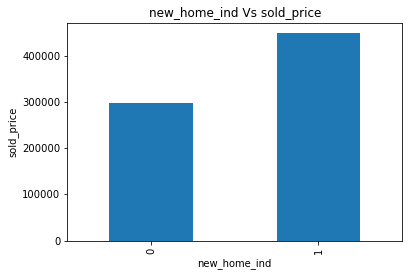

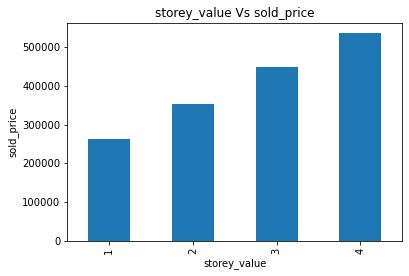

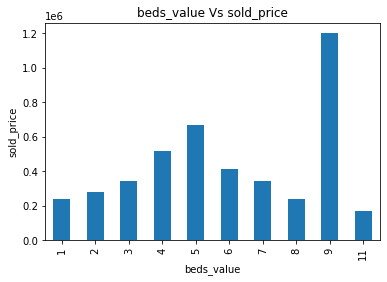

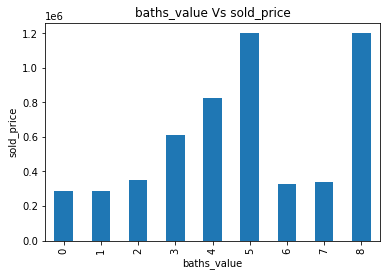

In [191]:
## Lets Find the realtionship between them and sold price

for feature in discrete_features:
    data=df.copy()
    data.groupby(feature)['sold_price'].median().plot.bar()
    plt.xlabel(feature)
    plt.ylabel('sold_price')
    plt.title(feature +" Vs sold_price")
    plt.show()

<h3><center style="color: blue;"><b>Continuous Variables </b> </center></h3>

In [192]:
continuous_features=[feature for feature in numerical_features if feature not in discrete_features+temporal_features]
print("Continuous feature Count {}".format(len(continuous_features)))
df[continuous_features].head()

Continuous feature Count 5


,sold_price,lat,lon,building_shape_area_value,sqm_value
0,165000,53.346098,-6.276856,129.755761,45.620000
1,547577,53.419113,-6.149744,66.594153,74.180000
2,443750,53.288762,-6.168170,69.189807,138.150000
3,417000,53.291416,-6.160378,79.314519,92.832656
4,250000,53.346391,-6.284521,93.625474,57.290000


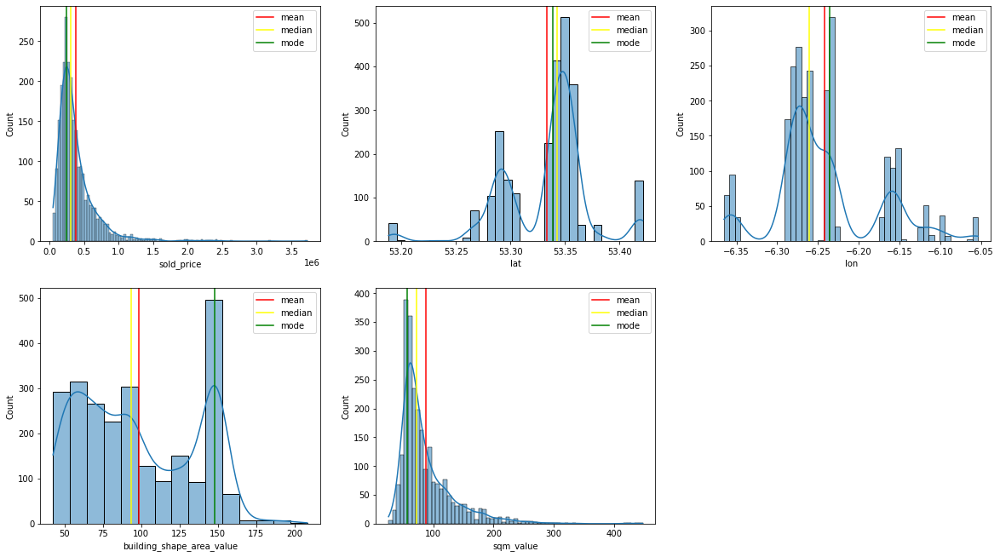

In [193]:
plt.figure(figsize=(20,60), facecolor='white')
plotnumber =1
for continuous_feature in continuous_features:
    ax = plt.subplot(10,3,plotnumber)
    sns.histplot(df[continuous_feature], kde=True)
    plt.axvline(df[continuous_feature].mean(), color='red', label="mean")
    plt.axvline(df[continuous_feature].median(), color='yellow', label ="median")
    plt.axvline(float(df[continuous_feature].mode()), color='green', label ="mode")
    plt.legend()
    plt.xlabel(continuous_feature)
    plotnumber+=1
plt.show() 

![Skewness](mmm.png "Skewness")

<h3><center style="color: blue;"><b>Outliers </b> </center></h3>

In [194]:
fig = make_subplots(rows=3, cols=1)
fig.add_trace(
    go.Box(x=df['sold_price'], name='sold_price'),
    row=1, col=1
)
fig.add_trace(
    go.Box(x=df['building_shape_area_value'], name='building_shape_area_value'),
    row=2, col=1
)
fig.add_trace(
    go.Box(x=df['sqm_value'], name='sqm_value'),
    row=3, col=1
)
fig.update_layout(title={'text': f"Box Plot of continuous variables", 'x': 0.5, 
                             'xanchor': 'center', 'font': {'size': 20}},height=600, width=980)

fig.show()


In [195]:
#Outliers
# Q1 = df.quantile(0.25)
# Q3 = df.quantile(0.75)
# IQR = Q3 - Q1
# df = df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q3 + 1.5 * IQR))).any(axis=1)]

In [196]:
#df.shape

In [197]:
# Outliers

# fig = make_subplots(rows=3, cols=1)
# fig.add_trace(
#     go.Box(x=df['sold_price'], name='sold_price'),
#     row=1, col=1
# )
# fig.add_trace(
#     go.Box(x=df['building_shape_area_value'], name='building_shape_area_value'),
#     row=2, col=1
# )
# fig.add_trace(
#     go.Box(x=df['sqm_value'], name='sqm_value'),
#     row=3, col=1
# )
# fig.update_layout(title={'text': f"Box Plot of continuous variables", 'x': 0.5, 
#                              'xanchor': 'center', 'font': {'size': 20}},height=600, width=980)

# fig.show()


<p style="text-align:justify;"><b>
We will not remove the outliers as we are loosing a large amount of data and the shape of the dataset comes out to be (1230,16) from (2453,16). I also cross verified it by applying a model on it and looking at its metrics; we are getting unsatisfiable PPE10 and PPE20 results.</b></p>



<h3><center style="color: blue;"><b> Correlated Features </b> </center></h3>

<p style="text-align:justify;"><b>
Firstly, I wrote a function which will find the highly correlated columns above the set threshold. Due to the curse of dimensionality, less features usually mean high improvement in terms of speed.</b></p>



In [198]:
def correlation(dataset,threshold):
    col_corr=set() # set will contains unique values.
    corr_matrix=dataset.corr() #finding the correlation between columns.
    for i in range(len(corr_matrix.columns)): #number of columns
        for j in range(i):
            if abs(corr_matrix.iloc[i,j])>threshold: #checking the correlation between columns.
                colName=corr_matrix.columns[i] #getting the column name
                col_corr.add(colName) #adding the correlated column name heigher than threshold value.
    return col_corr #returning set of column names

col=correlation(df,0.70)
print('Correlated columns:',col)

Correlated columns: set()


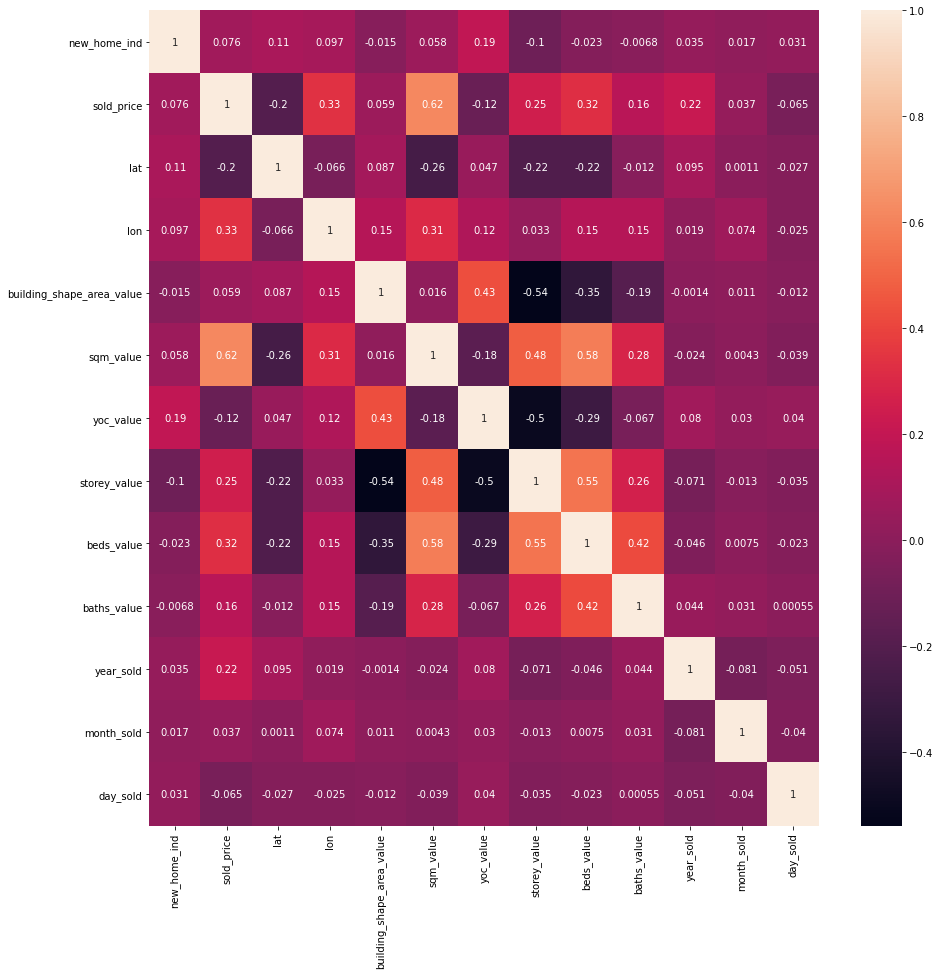

In [199]:
plt.figure(figsize=(15,15))
sns.heatmap(df.corr(), annot=True)
plt.show()

In [200]:
df1 = df[numerical_features]
def get_VIF(df1 , target):
    X = add_constant(df1.loc[:, df1.columns != target])
    seriesObject = pd.Series([variance_inflation_factor(X.values,i) for i in range(X.shape[1])] , index=X.columns)
    return seriesObject

In [201]:
target = 'sold_price'
get_VIF(df1,target)

const                        2.676851e+06
new_home_ind                 1.115679e+00
lat                          1.136959e+00
lon                          1.173775e+00
building_shape_area_value    1.961966e+00
sqm_value                    2.235781e+00
yoc_value                    1.517084e+00
storey_value                 2.430535e+00
beds_value                   2.096431e+00
baths_value                  1.272020e+00
year_sold                    1.036051e+00
month_sold                   1.016723e+00
day_sold                     1.011844e+00
dtype: float64

<p style="text-align:justify;"><b>
We see that the Variance Inflation factor is less than 5 for all the continuous features with the target variable, wherein we can say that the features are not highly but moderately correlated with the target variable.
1 = not correlated.
Between 1 and 5 = moderately correlated.
Greater than 5 = highly correlated. It is the ratio of the overall model variance to the variance of a model that includes only that single independent variable
    <a href="https://www.statisticshowto.com/variance-inflation-factor/"> Reference </a></b></p>



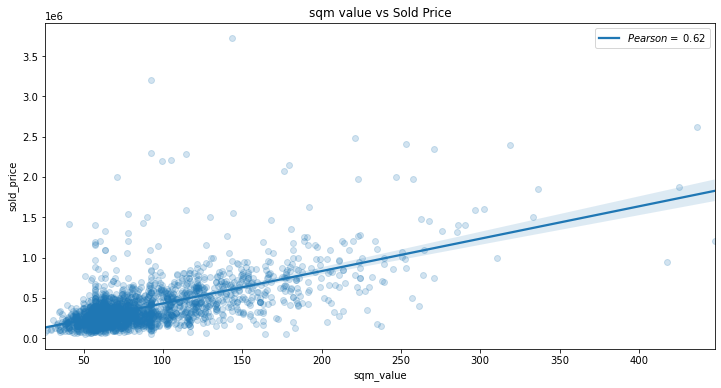

In [202]:
# sqm_value vs sold_price [corr = 0.62]
# As sqm_value is a continuos value using below plot to viz it
Pearson_sqm_value = 0.62
plt.figure(figsize = (12,6))
sns.regplot(data=df, x = 'sqm_value', y='sold_price', scatter_kws={'alpha':0.2})
plt.title('sqm value vs Sold Price', fontsize = 12)
plt.legend(['$Pearson=$ {:.2f}'.format(Pearson_sqm_value)], loc = 'best')
plt.show()

### Inference:
<ul>
    <li><p style="text-align:justify;"><b> As the sqm_value increases the Price also increases in most cases.</b></p></li>

</ul>

<h3><center style="color: blue;"><b>Categorical Variables </b> </center></h3>

In [203]:
categorical_features=[feature for feature in df.columns if df[feature].dtypes=='O']
df[categorical_features].head()

,post_county_name,eircode_area_code,building_property_subtype_code
0,dublin,D07,multi-family
1,dublin,D13,mid-terrace
2,dublin,A94,mid-terrace
3,dublin,A94,semidetached
4,dublin,D08,multi-family


In [204]:
for feature in categorical_features:
    print('The feature is {} and number of categories are {}'.format(feature,len(df[feature].unique())))

The feature is post_county_name and number of categories are 2
The feature is eircode_area_code and number of categories are 13
The feature is building_property_subtype_code and number of categories are 6


In [205]:
## Find out the relationship between categorical variable and dependent feature Maximum Sold Price

for feature in categorical_features:
    data=df.copy()
    fig = px.bar(data.groupby(feature).max(), 
             y="sold_price")
    fig.update_layout(title={'text': f" "+ feature +" Vs Maximum Sold Price", 'x': 0.5, 
                             'xanchor': 'center', 'font': {'size': 20}})
    fig.update_traces(marker_color='Orange')
    fig.show()

In [382]:
## Find out the relationship between categorical variable and dependent feature Sold Price

for feature in categorical_features:
    data=df.copy()
    fig = px.bar(data.groupby(feature).median(), 
             y="sold_price")
    fig.update_layout(title={'text': f" "+ feature +" Vs Median Sold Price", 'x': 0.5, 
                             'xanchor': 'center', 'font': {'size': 20}})
    fig.update_traces(marker_color='Orange')
    fig.show()

In [207]:
for feature in categorical_features:
    include = df.groupby(feature).size().sort_values(ascending=False).to_frame()
    include.reset_index(inplace=True)
    include.columns = [feature, 'Count']

    fig = px.pie(include, values='Count', names=feature)
    fig.update_layout(title={'text': f"Count of "+feature+"", 'x': 0.5,
                                 'xanchor': 'center', 'font': {'size': 20}})
    fig.show()

In [411]:
fig = px.scatter_mapbox(df_org,
                        lat="lat",
                        lon="lon",
                        color='eircode_area_code',
                        mapbox_style='carto-positron',
                        hover_name='postal_address',
                        center={"lat": 53.346098, "lon": -6.276856},
                        zoom=9.65,
                        hover_data=['eircode_area_code','post_county_name','sold_price','building_property_subtype_code'],
                        title= 'Properties in Dublin'
                       )
fig.update_geos(fitbounds="locations", visible=True)
fig.update_geos(projection_type="orthographic")
fig.update_layout(height=700,width=700,margin=dict(l=20,r=20,t=40,b=20), paper_bgcolor='LightSteelBlue')
fig.update_layout(
    legend=dict(
        x=0,
        y=0,
        traceorder="normal",
        font=dict(
            family="sans-serif",
            size=12,
            color="black"
        ),
        bgcolor="LightSteelBlue",
        bordercolor="Black",
        borderwidth=0
    )
)
fig.show()

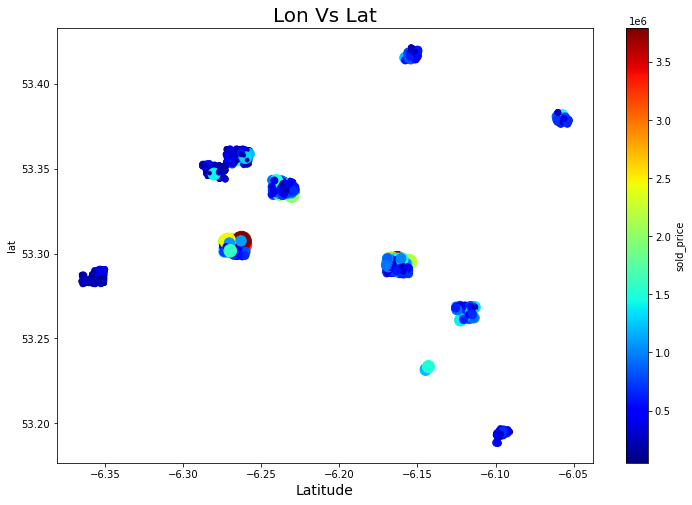

In [302]:
ax = df_org.plot(kind="scatter", x="lon",y="lat", figsize = (12,8),s=df_org['sold_price']/10000,
                c = "sold_price", cmap= plt.get_cmap("jet"), sharex=False)
plt.xlabel("Longitude", fontsize=14)
plt.xlabel("Latitude", fontsize=14)
plt.title("Lon Vs Lat", fontsize=20)
plt.show()

<p style="text-align:justify;"><b>
Above is the map of dublin with the clusters of properties according to the eircode area and the lat and lon.
    If we hover over the points, we can see more data related to the property.
    </b></p>

#### <center><h2> <font color='green'> Feature Engineering</font> </h2> </center>

<h3><center style="color: blue;"><b> Log Normalization </b> </center></h3>

<p style="text-align:justify;"><b>
Since the numerical variables are skewed we will perform log normal distribution:
    </b></p>

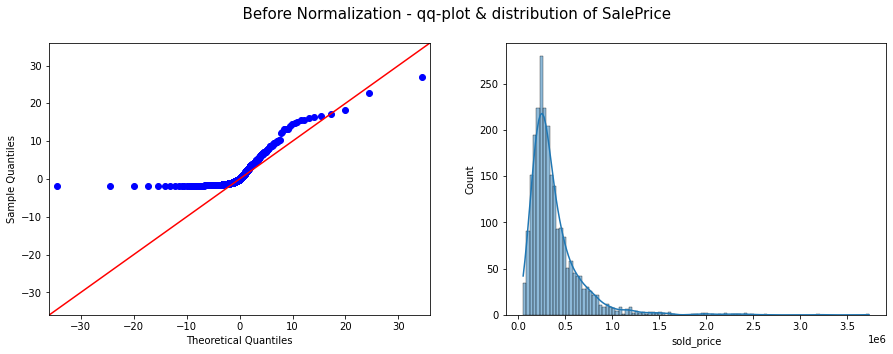

In [209]:
#Before Log Normalization
fig, ax = plt.subplots(1,2, figsize= (15,5))
fig.suptitle("  Before Normalization - qq-plot & distribution of SalePrice ", fontsize= 15)

sm.qqplot(df.sold_price, stats.t, distargs=(4,),fit=True, line="45", ax = ax[0])

sns.histplot(df.sold_price, kde = True, ax = ax[1])
plt.show()

In [210]:
df['sold_price']=np.log(df['sold_price'])

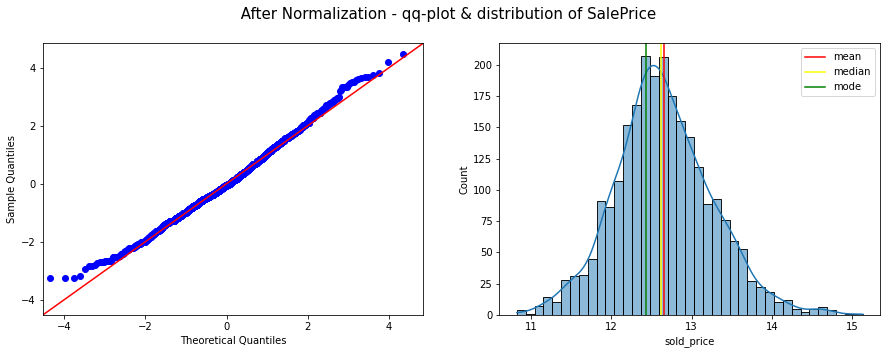

In [211]:
#After Log Normalization
fig, ax = plt.subplots(1,2, figsize= (15,5))
fig.suptitle(" After Normalization - qq-plot & distribution of SalePrice ", fontsize= 15)

sm.qqplot(df.sold_price, stats.t, distargs=(4,),fit=True, line="45", ax = ax[0])

sns.histplot(df.sold_price, kde = True, ax = ax[1])
plt.axvline(df.sold_price.mean(), color='red', label="mean")
plt.axvline(df.sold_price.median(), color='yellow', label ="median")
plt.axvline(float(df.sold_price.mode()), color='green', label ="mode")
plt.legend()
plt.show()

<h3><center style="color: blue;"><b> Encoding </b> </center></h3>

<p style="text-align:justify;"><b>
We will use One Hot Encoding for the categorical variables which are high in number of categories. I also tried modelling with Label Encoder, Ordinal Encoder but I was getting unsatisfiable metric results, so one hot encoding is our best bet.</b></p>



In [212]:
cat_columns = ['eircode_area_code', 'building_property_subtype_code']
for col in  cat_columns:
    df = pd.concat([df.drop(col, axis=1),pd.get_dummies(df[col], prefix=col, prefix_sep='_',drop_first=True, dummy_na=False)], axis=1)

In [213]:
df['post_county_name']=df['post_county_name'].apply(lambda x : 1 if x == 'dublin' else 0)

#### <center><h2> <font color='green'> Feature Selection</font> </h2> </center>

<h3><center style="color: blue;"><b> Mutual Info Regression </b> </center></h3>

In [214]:
dataset = df.copy()

In [215]:
X = dataset.drop(labels=['sold_price'], axis=1)
y = dataset['sold_price']

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.35, random_state=0)

#Creating copies
X_train_org=X_train.copy()

X_test_org=X_test.copy()

stand = StandardScaler()
stand = stand.fit(X_train)

X_train = stand.transform(X_train)
X_test = stand.transform(X_test)

X_train = pd.DataFrame(X_train, columns=X_train_org.columns)

X_test = pd.DataFrame(X_test, columns=X_test_org.columns)

mutual_info = mutual_info_regression(X_train, y_train, random_state=0)
mi_df = pd.DataFrame(mutual_info,index = X_train.columns, columns =['Mutual info score'])
mi_df.sort_values(by=['Mutual info score'],ascending=False,inplace=True)
mi_df

,Mutual info score
lat,0.374702
sqm_value,0.312744
lon,0.312516
yoc_value,0.133374
beds_value,0.133294
building_shape_area_value,0.105298
year_sold,0.096380
eircode_area_code_D07,0.095693
building_property_subtype_code_multi-family,0.085652
storey_value,0.060188


In [216]:
Req_Columns = list(mi_df[mi_df>0].index)
Req_Columns

['lat',
 'sqm_value',
 'lon',
 'yoc_value',
 'beds_value',
 'building_shape_area_value',
 'year_sold',
 'eircode_area_code_D07',
 'building_property_subtype_code_multi-family',
 'storey_value',
 'eircode_area_code_D04',
 'building_property_subtype_code_semidetached',
 'eircode_area_code_D24',
 'eircode_area_code_D13',
 'month_sold',
 'new_home_ind',
 'building_property_subtype_code_end-terrace',
 'eircode_area_code_A96',
 'baths_value',
 'eircode_area_code_D08',
 'eircode_area_code_D14',
 'eircode_area_code_D06',
 'day_sold',
 'building_property_subtype_code_mid-terrace',
 'eircode_area_code_D01',
 'post_county_name',
 'eircode_area_code_A98',
 'building_property_subtype_code_terraced',
 'eircode_area_code_D02',
 'eircode_area_code_D18']

<h3><center style="color: blue;"><b> Zero Variance Features </b> </center></h3>

In [217]:
# these features have the same values for a very large subset of the outputs
constant_filter = VarianceThreshold(threshold=0)
constant_filter.fit(X_train)

len(X_train.columns[constant_filter.get_support()])

constant_columns = [column for column in X_train.columns
                    if column not in X_train.columns[constant_filter.get_support()]]
constant_columns

[]

In [218]:
X_train.shape, X_test.shape

((1594, 30), (859, 30))

In [219]:
train_features = constant_filter.transform(X_train)
test_features = constant_filter.transform(X_test)

train_features.shape, test_features.shape

((1594, 30), (859, 30))

<h3><center style="color: blue;"><b> Quasi Constant Features </b> </center></h3>

In [220]:
# as a rule of thumb, remove those quasi-constant features that have more than 99% similar values for the output observations
qconstant_filter = VarianceThreshold(threshold=0.01)
qconstant_filter.fit(X_train)

len(X_train.columns[qconstant_filter.get_support()])

qconstant_columns = [column for column in X_train.columns
                    if column not in X_train.columns[qconstant_filter.get_support()]]

qconstant_columns

[]

In [221]:
train_features = qconstant_filter.transform(X_train)
test_features = qconstant_filter.transform(X_test)

train_features.shape, test_features.shape

((1594, 30), (859, 30))

<h3><center style="color: blue;"><b> Looking for duplicate values </b> </center></h3>

<p style="text-align:justify;"><b>
    We write a function which will find the duplicate columns and return the name of duplicated columns in an array
    </b></p>

In [222]:
def duplicateColumns(df):
    dupliCols=[]
    for i in range(0,len(df.columns)):
        col1=df.columns[i]
        for col2 in df.columns[i+1:]:
            if df[col1].equals(df[col2]):
                dupliCols.append(col1+','+col2)
    return dupliCols

duplCols=duplicateColumns(dataset)
duplCols
print('Total Duplicated columns',len(duplCols))
dCols=[col.split(',')[1] for col in duplCols]
dCols

Total Duplicated columns 0


[]

In [224]:
dataset.duplicated().sum()

0

<p style="text-align:justify;"><b>
Hence, we infer that there are no duplicate columns or values in the dataset.</b></p>

#### <center><h2> <font color='green'> ML Modelling</font> </h2> </center>

<p style="text-align:justify;"><b>
After implementing the mutual_info_reg, we use the features above 0 importance and include them in the dataset for further Machine Learning modelling.</b></p>



In [332]:
#Choosing the best mutual info features
df3 = df.copy()
df3 = df3[Req_Columns]
df3.loc[:, ('sold_price')] = df.loc[:, ('sold_price')]

In [333]:
# Train_Test_Split
X = df3.drop(labels=['sold_price'], axis=1)
y = df3['sold_price']

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.35, random_state=0)

#Creating copies
X_train_org=X_train.copy()

X_test_org=X_test.copy()

In [334]:
#Standard Scaling => mean=0 , std =1

stand = StandardScaler()
stand = stand.fit(X_train)

X_train = stand.transform(X_train)
X_test = stand.transform(X_test)

X_train = pd.DataFrame(X_train, columns=X_train_org.columns)

X_test = pd.DataFrame(X_test, columns=X_test_org.columns)

<h3><center style="color: blue;"><b> Metrics Defination </b> </center></h3>

In [335]:
#Metrics list for comparison at the end
list_cv_r2_score = []
list_r2_score = []
list_MdPE = []
list_MdAPE = []
list_MPE = []
list_MAPE = []
list_MSE = []
list_RMSE = []
list_MAE = []
list_MdAE = []
list_PPE05 = []
list_PPE10 = []
list_PPE20 = []
list_Outlier = []
train_r2 = []
list_baseline_models = ['Decision Tree Regressor','Linear Regression','KNeighbors Regressor','RandomForest Regressor',
                   'XGBoost Regressor','Support Vector Regressor', 'Bayesian Ridge Regression',
                   'Light Gradient Boost Regressor','Gradient Boosting Regressor','Cat Boost Regressor','Stacked Regressor']

In [336]:
def MdPE(y_test, y_pred):
    return (np.median((y_pred - y_test ) / y_test) * 100)

def MdAPE(y_test, y_pred):
    return (np.median(np.abs((y_pred - y_test) / y_test)) * 100)

def MPE(y_test, y_pred):
    return (np.mean((y_pred - y_test ) / y_test) * 100)

def MAPE(y_test, y_pred):
    return (np.mean(np.abs((y_pred - y_test) / y_test)) * 100)

def MSE(y_test, y_pred):
    return (mean_squared_error(y_test, y_pred))

def RMSE(y_test, y_pred):
    return (np.sqrt(mean_squared_error(y_test, y_pred)))

def MAE(y_test, y_pred):
    return (mean_absolute_error(y_test, y_pred) * 100)

def MdAE(y_test, y_pred):
    return (median_absolute_error(y_test, y_pred) * 100)

def PPE05(y_test, y_pred):
    PPE05 = 0
    PE = np.absolute(((y_pred - y_test ) / y_test) * 100)
    for i in PE:
        if(i <=5):
            PPE05 = PPE05+1
    res = PPE05/len(PE) * 100
    return (res)
    
def PPE10(y_test, y_pred):
    PPE10 = 0
    PE = np.absolute(((y_pred - y_test ) / y_test) * 100)
    for i in PE:
        if(i <=10):
            PPE10 = PPE10+1
    res = PPE10/len(PE) * 100
    return (res)

def PPE20(y_test, y_pred):
    PPE20 = 0
    PE = np.absolute(((y_pred - y_test ) / y_test) * 100)
    for i in PE:
        if(i <=20):
            PPE20 = PPE20+1
    res = PPE20/len(PE) * 100
    return (res)

def Outlier(y_test, y_pred):
    Outlier = 0
    PE = np.absolute(((y_pred - y_test ) / y_test) * 100)
    for i in PE:
        if(i >20):
            Outlier = Outlier+1
    res = Outlier/len(PE) * 100
    return (res)

<h3><center style="color: blue;"><b> Decision Tree Regressor </b> </center></h3>

In [337]:
decTree_reg = DecisionTreeRegressor(random_state=0)
decTree_reg.fit(X_train,y_train)
y_pred = decTree_reg.predict(X_test)
y_test, y_pred = np.array(y_test), np.array(y_pred)

print("PPE05 = ", PPE05(y_test, y_pred))
list_PPE05.append(round(PPE05(y_test, y_pred),4))

print("PPE10 = ", PPE10(y_test, y_pred))
list_PPE10.append(round(PPE10(y_test, y_pred),4))

print("PPE20 = ", PPE20(y_test, y_pred))
list_PPE20.append(round(PPE20(y_test, y_pred),4))

print("Outlier = ", Outlier(y_test, y_pred))
list_Outlier.append(round(Outlier(y_test, y_pred),4))

print("Median Percentage Error (MdPE): ", MdPE(y_test, y_pred))
list_MdPE.append(round(MdPE(y_test, y_pred),4))

print("Median Absolute Percentage Error (MdAPE): ", MdAPE(y_test, y_pred))
list_MdAPE.append(round(MdAPE(y_test, y_pred),4))

print("Mean Percentage Error: ", MPE(y_test, y_pred))
list_MPE.append(round(MPE(y_test, y_pred),4))

print("Mean Absolute Percentage Error: ", MAPE(y_test, y_pred))
list_MAPE.append(round(MAPE(y_test, y_pred),4))

print("R2-score: %.2f" % r2_score(y_test, y_pred) )
list_r2_score.append(round(r2_score(y_test, y_pred),4))

print("SKLEARN's Residual sum of squares (MSE): ", MSE(y_test, y_pred))
list_MSE.append(round(MSE(y_test, y_pred),4))

print("SKLEARN's Residual sum (RMSE): ", RMSE(y_test, y_pred))
list_RMSE.append(round(RMSE(y_test, y_pred),4))

print("SKLEARN's Median Absolute Percentage Error (MAE):",MAE(y_test, y_pred))
list_MAE.append(round(MAE(y_test, y_pred),4))

print("SKLEARN's Median Absolute Percentage Error (MdAE):",MdAE(y_test, y_pred))
list_MdAE.append(round(MdAE(y_test, y_pred),4))

print("Accuracy on Training set: ",decTree_reg.score(X_train,y_train))
train_r2.append(round(decTree_reg.score(X_train,y_train),4))

kf = KFold(n_splits=10, shuffle=True, random_state=42).get_n_splits(X_train.values)
r2= cross_val_score(decTree_reg, X_train, y_train, scoring="r2", cv = kf)
print("Cross Validation r2 score = ", r2.mean())
list_cv_r2_score.append(round(r2.mean(),4))

PPE05 =  86.61233993015134
PPE10 =  97.90454016298021
PPE20 =  99.88358556461002
Outlier =  0.11641443538998836
Median Percentage Error (MdPE):  0.0
Median Absolute Percentage Error (MdAPE):  1.925638211995832
Mean Percentage Error:  -0.06563472874690517
Mean Absolute Percentage Error:  2.597502363716572
R2-score: 0.43
SKLEARN's Residual sum of squares (MSE):  0.22004168918122868
SKLEARN's Residual sum (RMSE):  0.46908601469371125
SKLEARN's Median Absolute Percentage Error (MAE): 32.73152834043114
SKLEARN's Median Absolute Percentage Error (MdAE): 24.4196960512042
Accuracy on Training set:  1.0
Cross Validation r2 score =  0.41298451399273206


<h3><center style="color: blue;"><b> Linear Regression </b> </center></h3>

In [338]:
linear_reg = LinearRegression()
linear_reg.fit(X_train,y_train)
y_pred = linear_reg.predict(X_test)
y_test, y_pred = np.array(y_test), np.array(y_pred)

print("PPE05 = ", PPE05(y_test, y_pred))
list_PPE05.append(round(PPE05(y_test, y_pred),4))

print("PPE10 = ", PPE10(y_test, y_pred))
list_PPE10.append(round(PPE10(y_test, y_pred),4))

print("PPE20 = ", PPE20(y_test, y_pred))
list_PPE20.append(round(PPE20(y_test, y_pred),4))

print("Outlier = ", Outlier(y_test, y_pred))
list_Outlier.append(round(Outlier(y_test, y_pred),4))

print("Median Percentage Error (MdPE): ", MdPE(y_test, y_pred))
list_MdPE.append(round(MdPE(y_test, y_pred),4))

print("Median Absolute Percentage Error (MdAPE): ", MdAPE(y_test, y_pred))
list_MdAPE.append(round(MdAPE(y_test, y_pred),4))

print("Mean Percentage Error: ", MPE(y_test, y_pred))
list_MPE.append(round(MPE(y_test, y_pred),4))

print("Mean Absolute Percentage Error: ", MAPE(y_test, y_pred))
list_MAPE.append(round(MAPE(y_test, y_pred),4))

print("R2-score: %.2f" % r2_score(y_test, y_pred) )
list_r2_score.append(round(r2_score(y_test, y_pred),4))

print("SKLEARN's Residual sum of squares (MSE): ", MSE(y_test, y_pred))
list_MSE.append(round(MSE(y_test, y_pred),4))

print("SKLEARN's Residual sum (RMSE): ", RMSE(y_test, y_pred))
list_RMSE.append(round(RMSE(y_test, y_pred),4))

print("SKLEARN's Median Absolute Percentage Error (MAE):",MAE(y_test, y_pred))
list_MAE.append(round(MAE(y_test, y_pred),4))

print("SKLEARN's Median Absolute Percentage Error (MdAE):",MdAE(y_test, y_pred))
list_MdAE.append(round(MdAE(y_test, y_pred),4))

print("Accuracy on Training set: ",linear_reg.score(X_train,y_train))
train_r2.append(round(linear_reg.score(X_train,y_train),4))

kf = KFold(n_splits=10, shuffle=True, random_state=42).get_n_splits(X_train.values)
r2= cross_val_score(linear_reg, X_train, y_train, scoring="r2", cv = kf)
print("Cross Validation r2 score = ", r2.mean())
list_cv_r2_score.append(round(r2.mean(),4))

PPE05 =  93.36437718277067
PPE10 =  99.18509895227008
PPE20 =  99.88358556461002
Outlier =  0.11641443538998836
Median Percentage Error (MdPE):  -0.050716077139247244
Median Absolute Percentage Error (MdAPE):  1.3042953893359301
Mean Percentage Error:  0.08286293022213675
Mean Absolute Percentage Error:  1.8722575527984386
R2-score: 0.68
SKLEARN's Residual sum of squares (MSE):  0.12396782477226773
SKLEARN's Residual sum (RMSE):  0.35209064851578736
SKLEARN's Median Absolute Percentage Error (MAE): 23.511839014951406
SKLEARN's Median Absolute Percentage Error (MdAE): 16.657049685768754
Accuracy on Training set:  0.6992334552249491
Cross Validation r2 score =  0.6827706132693354


<h3><center style="color: blue;"><b> KNeighbors Regressor </b> </center></h3>

In [339]:
Kneigh_reg = KNeighborsRegressor(n_neighbors=5)
Kneigh_reg.fit(X_train,y_train)
y_pred = Kneigh_reg.predict(X_test)
y_test, y_pred = np.array(y_test), np.array(y_pred)

print("PPE05 = ", PPE05(y_test, y_pred))
list_PPE05.append(round(PPE05(y_test, y_pred),4))

print("PPE10 = ", PPE10(y_test, y_pred))
list_PPE10.append(round(PPE10(y_test, y_pred),4))

print("PPE20 = ", PPE20(y_test, y_pred))
list_PPE20.append(round(PPE20(y_test, y_pred),4))

print("Outlier = ", Outlier(y_test, y_pred))
list_Outlier.append(round(Outlier(y_test, y_pred),4))

print("Median Percentage Error (MdPE): ", MdPE(y_test, y_pred))
list_MdPE.append(round(MdPE(y_test, y_pred),4))

print("Median Absolute Percentage Error (MdAPE): ", MdAPE(y_test, y_pred))
list_MdAPE.append(round(MdAPE(y_test, y_pred),4))

print("Mean Percentage Error: ", MPE(y_test, y_pred))
list_MPE.append(round(MPE(y_test, y_pred),4))

print("Mean Absolute Percentage Error: ", MAPE(y_test, y_pred))
list_MAPE.append(round(MAPE(y_test, y_pred),4))

print("R2-score: %.2f" % r2_score(y_test, y_pred) )
list_r2_score.append(round(r2_score(y_test, y_pred),4))

print("SKLEARN's Residual sum of squares (MSE): ", MSE(y_test, y_pred))
list_MSE.append(round(MSE(y_test, y_pred),4))

print("SKLEARN's Residual sum (RMSE): ", RMSE(y_test, y_pred))
list_RMSE.append(round(RMSE(y_test, y_pred),4))

print("SKLEARN's Median Absolute Percentage Error (MAE):",MAE(y_test, y_pred))
list_MAE.append(round(MAE(y_test, y_pred),4))

print("SKLEARN's Median Absolute Percentage Error (MdAE):",MdAE(y_test, y_pred))
list_MdAE.append(round(MdAE(y_test, y_pred),4))

print("R2 on Training set: ",Kneigh_reg.score(X_train,y_train))
train_r2.append(round(Kneigh_reg.score(X_train,y_train),4))

kf = KFold(n_splits=10, shuffle=True, random_state=42).get_n_splits(X_train.values)
r2= cross_val_score(Kneigh_reg, X_train, y_train, scoring="r2", cv = kf)
print("Cross Validation r2 score = ", r2.mean())
list_cv_r2_score.append(round(r2.mean(),4))

PPE05 =  90.45401629802096
PPE10 =  98.60302677532013
PPE20 =  100.0
Outlier =  0.0
Median Percentage Error (MdPE):  -0.16291485524977078
Median Absolute Percentage Error (MdAPE):  1.6693060846789596
Mean Percentage Error:  0.05388499110376552
Mean Absolute Percentage Error:  2.298192167567725
R2-score: 0.58
SKLEARN's Residual sum of squares (MSE):  0.1598083146170218
SKLEARN's Residual sum (RMSE):  0.3997603214640265
SKLEARN's Median Absolute Percentage Error (MAE): 28.97523765029888
SKLEARN's Median Absolute Percentage Error (MdAE): 21.13275040753031
R2 on Training set:  0.7348820109991878
Cross Validation r2 score =  0.5777486653946096


<h3><center style="color: blue;"><b> Random Forest Regressor </b> </center></h3>

In [340]:
reg_rfr = RandomForestRegressor()
reg_rfr.fit(X_train,y_train)
y_pred = reg_rfr.predict(X_test)
y_test, y_pred = np.array(y_test), np.array(y_pred)

print("PPE05 = ", PPE05(y_test, y_pred))
list_PPE05.append(round(PPE05(y_test, y_pred),4))

print("PPE10 = ", PPE10(y_test, y_pred))
list_PPE10.append(round(PPE10(y_test, y_pred),4))

print("PPE20 = ", PPE20(y_test, y_pred))
list_PPE20.append(round(PPE20(y_test, y_pred),4))

print("Outlier = ", Outlier(y_test, y_pred))
list_Outlier.append(round(Outlier(y_test, y_pred),4))

print("Median Percentage Error (MdPE): ", MdPE(y_test, y_pred))
list_MdPE.append(round(MdPE(y_test, y_pred),4))

print("Median Absolute Percentage Error (MdAPE): ", MdAPE(y_test, y_pred))
list_MdAPE.append(round(MdAPE(y_test, y_pred),4))

print("Mean Percentage Error: ", MPE(y_test, y_pred))
list_MPE.append(round(MPE(y_test, y_pred),4))

print("Mean Absolute Percentage Error: ", MAPE(y_test, y_pred))
list_MAPE.append(round(MAPE(y_test, y_pred),4))

print("R2-score: %.2f" % r2_score(y_test, y_pred) )
list_r2_score.append(round(r2_score(y_test, y_pred),4))

print("SKLEARN's Residual sum of squares (MSE): ", MSE(y_test, y_pred))
list_MSE.append(round(MSE(y_test, y_pred),4))

print("SKLEARN's Residual sum (RMSE): ", RMSE(y_test, y_pred))
list_RMSE.append(round(RMSE(y_test, y_pred),4))

print("SKLEARN's Median Absolute Percentage Error (MAE):",MAE(y_test, y_pred))
list_MAE.append(round(MAE(y_test, y_pred),4))

print("SKLEARN's Median Absolute Percentage Error (MdAE):",MdAE(y_test, y_pred))
list_MdAE.append(round(MdAE(y_test, y_pred),4))

print("R2 on Training set: ",reg_rfr.score(X_train,y_train))
train_r2.append(round(reg_rfr.score(X_train,y_train),4))

kf = KFold(n_splits=10, shuffle=True, random_state=42).get_n_splits(X_train.values)
r2= cross_val_score(reg_rfr, X_train, y_train, scoring="r2", cv = kf)
print("Cross Validation r2 score = ", r2.mean())
list_cv_r2_score.append(round(r2.mean(),4))

PPE05 =  93.71362048894063
PPE10 =  99.18509895227008
PPE20 =  99.88358556461002
Outlier =  0.11641443538998836
Median Percentage Error (MdPE):  -0.05756891436660875
Median Absolute Percentage Error (MdAPE):  1.290118023180277
Mean Percentage Error:  0.10179684285200967
Mean Absolute Percentage Error:  1.8519569617486922
R2-score: 0.70
SKLEARN's Residual sum of squares (MSE):  0.11575758059424986
SKLEARN's Residual sum (RMSE):  0.34023165724877785
SKLEARN's Median Absolute Percentage Error (MAE): 23.282177865128144
SKLEARN's Median Absolute Percentage Error (MdAE): 16.6455829528795
R2 on Training set:  0.9564280024139733
Cross Validation r2 score =  0.676621325895875


<h3><center style="color: blue;"><b> XGBoost Regressor </b> </center></h3>

In [341]:
xgb_model = xgb.XGBRegressor()
xgb_model.fit(X_train,y_train)
y_pred = xgb_model.predict(X_test)
y_test, y_pred = np.array(y_test), np.array(y_pred)

print("PPE05 = ", PPE05(y_test, y_pred))
list_PPE05.append(round(PPE05(y_test, y_pred),4))

print("PPE10 = ", PPE10(y_test, y_pred))
list_PPE10.append(round(PPE10(y_test, y_pred),4))

print("PPE20 = ", PPE20(y_test, y_pred))
list_PPE20.append(round(PPE20(y_test, y_pred),4))

print("Outlier = ", Outlier(y_test, y_pred))
list_Outlier.append(round(Outlier(y_test, y_pred),4))

print("Median Percentage Error (MdPE): ", MdPE(y_test, y_pred))
list_MdPE.append(round(MdPE(y_test, y_pred),4))

print("Median Absolute Percentage Error (MdAPE): ", MdAPE(y_test, y_pred))
list_MdAPE.append(round(MdAPE(y_test, y_pred),4))

print("Mean Percentage Error: ", MPE(y_test, y_pred))
list_MPE.append(round(MPE(y_test, y_pred),4))

print("Mean Absolute Percentage Error: ", MAPE(y_test, y_pred))
list_MAPE.append(round(MAPE(y_test, y_pred),4))

print("R2-score: %.2f" % r2_score(y_test, y_pred) )
list_r2_score.append(round(r2_score(y_test, y_pred),4))

print("SKLEARN's Residual sum of squares (MSE): ", MSE(y_test, y_pred))
list_MSE.append(round(MSE(y_test, y_pred),4))

print("SKLEARN's Residual sum (RMSE): ", RMSE(y_test, y_pred))
list_RMSE.append(round(RMSE(y_test, y_pred),4))

print("SKLEARN's Median Absolute Percentage Error (MAE):",MAE(y_test, y_pred))
list_MAE.append(round(MAE(y_test, y_pred),4))

print("SKLEARN's Median Absolute Percentage Error (MdAE):",MdAE(y_test, y_pred))
list_MdAE.append(round(MdAE(y_test, y_pred),4))

print("R2 on Training set: ",xgb_model.score(X_train,y_train))
train_r2.append(round(xgb_model.score(X_train,y_train),4))

kf = KFold(n_splits=10, shuffle=True, random_state=42).get_n_splits(X_train.values)
r2= cross_val_score(xgb_model, X_train, y_train, scoring="r2", cv = kf)
print("Cross Validation r2 score = ", r2.mean())
list_cv_r2_score.append(round(r2.mean(),4))

PPE05 =  94.17927823050059
PPE10 =  99.41792782305005
PPE20 =  99.88358556461002
Outlier =  0.11641443538998836
Median Percentage Error (MdPE):  -0.0634640221561817
Median Absolute Percentage Error (MdAPE):  1.270343493339127
Mean Percentage Error:  0.06882225848150621
Mean Absolute Percentage Error:  1.7928811302577154
R2-score: 0.71
SKLEARN's Residual sum of squares (MSE):  0.11034633718913092
SKLEARN's Residual sum (RMSE):  0.3321841916604866
SKLEARN's Median Absolute Percentage Error (MAE): 22.543661319788345
SKLEARN's Median Absolute Percentage Error (MdAE): 16.163126051879395
R2 on Training set:  0.9902888364337037
Cross Validation r2 score =  0.6659722542332673


<h3><center style="color: blue;"><b> SVR (Support Vector Regressor Machine) </b> </center></h3>

In [342]:
SVR_model=SVR()
SVR_model.fit(X_train,y_train)
y_pred = SVR_model.predict(X_test)
y_test, y_pred = np.array(y_test), np.array(y_pred)

print("PPE05 = ", PPE05(y_test, y_pred))
list_PPE05.append(round(PPE05(y_test, y_pred),4))

print("PPE10 = ", PPE10(y_test, y_pred))
list_PPE10.append(round(PPE10(y_test, y_pred),4))

print("PPE20 = ", PPE20(y_test, y_pred))
list_PPE20.append(round(PPE20(y_test, y_pred),4))

print("Outlier = ", Outlier(y_test, y_pred))
list_Outlier.append(round(Outlier(y_test, y_pred),4))

print("Median Percentage Error (MdPE): ", MdPE(y_test, y_pred))
list_MdPE.append(round(MdPE(y_test, y_pred),4))

print("Median Absolute Percentage Error (MdAPE): ", MdAPE(y_test, y_pred))
list_MdAPE.append(round(MdAPE(y_test, y_pred),4))

print("Mean Percentage Error: ", MPE(y_test, y_pred))
list_MPE.append(round(MPE(y_test, y_pred),4))

print("Mean Absolute Percentage Error: ", MAPE(y_test, y_pred))
list_MAPE.append(round(MAPE(y_test, y_pred),4))

print("R2-score: %.2f" % r2_score(y_test, y_pred) )
list_r2_score.append(round(r2_score(y_test, y_pred),4))

print("SKLEARN's Residual sum of squares (MSE): ", MSE(y_test, y_pred))
list_MSE.append(round(MSE(y_test, y_pred),4))

print("SKLEARN's Residual sum (RMSE): ", RMSE(y_test, y_pred))
list_RMSE.append(round(RMSE(y_test, y_pred),4))

print("SKLEARN's Median Absolute Percentage Error (MAE):",MAE(y_test, y_pred))
list_MAE.append(round(MAE(y_test, y_pred),4))

print("SKLEARN's Median Absolute Percentage Error (MdAE):",MdAE(y_test, y_pred))
list_MdAE.append(round(MdAE(y_test, y_pred),4))

print("R2 on Training set: ",SVR_model.score(X_train,y_train))
train_r2.append(round(SVR_model.score(X_train,y_train),4))

kf = KFold(n_splits=10, shuffle=True, random_state=42).get_n_splits(X_train.values)
r2= cross_val_score(SVR_model, X_train, y_train, scoring="r2", cv = kf)
print("Cross Validation r2 score = ", r2.mean())
list_cv_r2_score.append(round(r2.mean(),4))

PPE05 =  92.78230500582072
PPE10 =  99.41792782305005
PPE20 =  99.88358556461002
Outlier =  0.11641443538998836
Median Percentage Error (MdPE):  -0.0011178717756279493
Median Absolute Percentage Error (MdAPE):  1.3284375023144277
Mean Percentage Error:  0.13614155252954205
Mean Absolute Percentage Error:  1.8812085300091537
R2-score: 0.68
SKLEARN's Residual sum of squares (MSE):  0.12135462818880721
SKLEARN's Residual sum (RMSE):  0.3483599118566992
SKLEARN's Median Absolute Percentage Error (MAE): 23.68972507893442
SKLEARN's Median Absolute Percentage Error (MdAE): 16.594755186013543
R2 on Training set:  0.7951981527602399
Cross Validation r2 score =  0.6775353709677698


<h3><center style="color: blue;"><b> Bayesian Ridge Regression </b> </center></h3>

In [343]:
BRR_model=BayesianRidge(compute_score=True)
BRR_model.fit(X_train,y_train)
y_pred = BRR_model.predict(X_test)
y_test, y_pred = np.array(y_test), np.array(y_pred)

print("PPE05 = ", PPE05(y_test, y_pred))
list_PPE05.append(round(PPE05(y_test, y_pred),4))

print("PPE10 = ", PPE10(y_test, y_pred))
list_PPE10.append(round(PPE10(y_test, y_pred),4))

print("PPE20 = ", PPE20(y_test, y_pred))
list_PPE20.append(round(PPE20(y_test, y_pred),4))

print("Outlier = ", Outlier(y_test, y_pred))
list_Outlier.append(round(Outlier(y_test, y_pred),4))

print("Median Percentage Error (MdPE): ", MdPE(y_test, y_pred))
list_MdPE.append(round(MdPE(y_test, y_pred),4))

print("Median Absolute Percentage Error (MdAPE): ", MdAPE(y_test, y_pred))
list_MdAPE.append(round(MdAPE(y_test, y_pred),4))

print("Mean Percentage Error: ", MPE(y_test, y_pred))
list_MPE.append(round(MPE(y_test, y_pred),4))

print("Mean Absolute Percentage Error: ", MAPE(y_test, y_pred))
list_MAPE.append(round(MAPE(y_test, y_pred),4))

print("R2-score: %.2f" % r2_score(y_test, y_pred) )
list_r2_score.append(round(r2_score(y_test, y_pred),4))

print("SKLEARN's Residual sum of squares (MSE): ", MSE(y_test, y_pred))
list_MSE.append(round(MSE(y_test, y_pred),4))

print("SKLEARN's Residual sum (RMSE): ", RMSE(y_test, y_pred))
list_RMSE.append(round(RMSE(y_test, y_pred),4))

print("SKLEARN's Median Absolute Percentage Error (MAE):",MAE(y_test, y_pred))
list_MAE.append(round(MAE(y_test, y_pred),4))

print("SKLEARN's Median Absolute Percentage Error (MdAE):",MdAE(y_test, y_pred))
list_MdAE.append(round(MdAE(y_test, y_pred),4))

print("R2 on Training set: ",BRR_model.score(X_train,y_train))
train_r2.append(round(BRR_model.score(X_train,y_train),4))

kf = KFold(n_splits=10, shuffle=True, random_state=42).get_n_splits(X_train.values)
r2= cross_val_score(BRR_model, X_train, y_train, scoring="r2", cv = kf)
print("Cross Validation r2 score = ", r2.mean())
list_cv_r2_score.append(round(r2.mean(),4))

PPE05 =  93.36437718277067
PPE10 =  99.18509895227008
PPE20 =  99.88358556461002
Outlier =  0.11641443538998836
Median Percentage Error (MdPE):  -0.07299689999035629
Median Absolute Percentage Error (MdAPE):  1.3295782015104258
Mean Percentage Error:  0.08271466930288875
Mean Absolute Percentage Error:  1.8826140990539448
R2-score: 0.68
SKLEARN's Residual sum of squares (MSE):  0.12291820892773186
SKLEARN's Residual sum (RMSE):  0.35059693228511263
SKLEARN's Median Absolute Percentage Error (MAE): 23.638834368875738
SKLEARN's Median Absolute Percentage Error (MdAE): 16.8647486704522
R2 on Training set:  0.6980917903782715
Cross Validation r2 score =  0.6822981318412793


<h3><center style="color: blue;"><b> Light Gradient Boost Regressor </b> </center></h3>

In [344]:
LGBMR_model=LGBMRegressor(objective='regression')
LGBMR_model.fit(X_train,y_train)
y_pred = LGBMR_model.predict(X_test)
y_test, y_pred = np.array(y_test), np.array(y_pred)

print("PPE05 = ", PPE05(y_test, y_pred))
list_PPE05.append(round(PPE05(y_test, y_pred),4))

print("PPE10 = ", PPE10(y_test, y_pred))
list_PPE10.append(round(PPE10(y_test, y_pred),4))

print("PPE20 = ", PPE20(y_test, y_pred))
list_PPE20.append(round(PPE20(y_test, y_pred),4))

print("Outlier = ", Outlier(y_test, y_pred))
list_Outlier.append(round(Outlier(y_test, y_pred),4))

print("Median Percentage Error (MdPE): ", MdPE(y_test, y_pred))
list_MdPE.append(round(MdPE(y_test, y_pred),4))

print("Median Absolute Percentage Error (MdAPE): ", MdAPE(y_test, y_pred))
list_MdAPE.append(round(MdAPE(y_test, y_pred),4))

print("Mean Percentage Error: ", MPE(y_test, y_pred))
list_MPE.append(round(MPE(y_test, y_pred),4))

print("Mean Absolute Percentage Error: ", MAPE(y_test, y_pred))
list_MAPE.append(round(MAPE(y_test, y_pred),4))

print("R2-score: %.2f" % r2_score(y_test, y_pred) )
list_r2_score.append(round(r2_score(y_test, y_pred),4))

print("SKLEARN's Residual sum of squares (MSE): ", MSE(y_test, y_pred))
list_MSE.append(round(MSE(y_test, y_pred),4))

print("SKLEARN's Residual sum (RMSE): ", RMSE(y_test, y_pred))
list_RMSE.append(round(RMSE(y_test, y_pred),4))

print("SKLEARN's Median Absolute Percentage Error (MAE):",MAE(y_test, y_pred))
list_MAE.append(round(MAE(y_test, y_pred),4))

print("SKLEARN's Median Absolute Percentage Error (MdAE):",MdAE(y_test, y_pred))
list_MdAE.append(round(MdAE(y_test, y_pred),4))

print("R2 on Training set: ",LGBMR_model.score(X_train,y_train))
train_r2.append(round(LGBMR_model.score(X_train,y_train),4))

kf = KFold(n_splits=10, shuffle=True, random_state=42).get_n_splits(X_train.values)
r2= cross_val_score(LGBMR_model, X_train, y_train, scoring="r2", cv = kf)
print("Cross Validation r2 score = ", r2.mean())
list_cv_r2_score.append(round(r2.mean(),4))

PPE05 =  94.41210710128057
PPE10 =  99.0686845168801
PPE20 =  99.88358556461002
Outlier =  0.11641443538998836
Median Percentage Error (MdPE):  -0.08078213454831312
Median Absolute Percentage Error (MdAPE):  1.179143962821515
Mean Percentage Error:  0.08178631698571813
Mean Absolute Percentage Error:  1.7309170097708309
R2-score: 0.72
SKLEARN's Residual sum of squares (MSE):  0.10748462899462916
SKLEARN's Residual sum (RMSE):  0.32784848481368517
SKLEARN's Median Absolute Percentage Error (MAE): 21.797965950795135
SKLEARN's Median Absolute Percentage Error (MdAE): 14.946918811667054
R2 on Training set:  0.9296249541976903
Cross Validation r2 score =  0.7060513272419181


<h3><center style="color: blue;"><b> Gradient Boosting Regressor </b> </center></h3>

In [345]:
GBR_model=GradientBoostingRegressor()
GBR_model.fit(X_train,y_train)
y_pred = GBR_model.predict(X_test)
y_test, y_pred = np.array(y_test), np.array(y_pred)

print("PPE05 = ", PPE05(y_test, y_pred))
list_PPE05.append(round(PPE05(y_test, y_pred),4))

print("PPE10 = ", PPE10(y_test, y_pred))
list_PPE10.append(round(PPE10(y_test, y_pred),4))

print("PPE20 = ", PPE20(y_test, y_pred))
list_PPE20.append(round(PPE20(y_test, y_pred),4))

print("Outlier = ", Outlier(y_test, y_pred))
list_Outlier.append(round(Outlier(y_test, y_pred),4))

print("Median Percentage Error (MdPE): ", MdPE(y_test, y_pred))
list_MdPE.append(round(MdPE(y_test, y_pred),4))

print("Median Absolute Percentage Error (MdAPE): ", MdAPE(y_test, y_pred))
list_MdAPE.append(round(MdAPE(y_test, y_pred),4))

print("Mean Percentage Error: ", MPE(y_test, y_pred))
list_MPE.append(round(MPE(y_test, y_pred),4))

print("Mean Absolute Percentage Error: ", MAPE(y_test, y_pred))
list_MAPE.append(round(MAPE(y_test, y_pred),4))

print("R2-score: %.2f" % r2_score(y_test, y_pred) )
list_r2_score.append(round(r2_score(y_test, y_pred),4))

print("SKLEARN's Residual sum of squares (MSE): ", MSE(y_test, y_pred))
list_MSE.append(round(MSE(y_test, y_pred),4))

print("SKLEARN's Residual sum (RMSE): ", RMSE(y_test, y_pred))
list_RMSE.append(round(RMSE(y_test, y_pred),4))

print("SKLEARN's Median Absolute Percentage Error (MAE):",MAE(y_test, y_pred))
list_MAE.append(round(MAE(y_test, y_pred),4))

print("SKLEARN's Median Absolute Percentage Error (MdAE):",MdAE(y_test, y_pred))
list_MdAE.append(round(MdAE(y_test, y_pred),4))

print("R2 on Training set: ",GBR_model.score(X_train,y_train))
train_r2.append(round(GBR_model.score(X_train,y_train),4))

kf = KFold(n_splits=10, shuffle=True, random_state=42).get_n_splits(X_train.values)
r2= cross_val_score(GBR_model, X_train, y_train, scoring="r2", cv = kf)
print("Cross Validation r2 score = ", r2.mean())
list_cv_r2_score.append(round(r2.mean(),4))

PPE05 =  94.0628637951106
PPE10 =  99.18509895227008
PPE20 =  99.88358556461002
Outlier =  0.11641443538998836
Median Percentage Error (MdPE):  -0.08482648323332971
Median Absolute Percentage Error (MdAPE):  1.2438158337593022
Mean Percentage Error:  0.07435887694481016
Mean Absolute Percentage Error:  1.7782290103307914
R2-score: 0.71
SKLEARN's Residual sum of squares (MSE):  0.11086357296642384
SKLEARN's Residual sum (RMSE):  0.33296181908204403
SKLEARN's Median Absolute Percentage Error (MAE): 22.383949223338174
SKLEARN's Median Absolute Percentage Error (MdAE): 15.794888773944038
R2 on Training set:  0.8037927592397097
Cross Validation r2 score =  0.7061490213541984


<h3><center style="color: blue;"><b> Cat Boost Regressor </b> </center></h3>

In [346]:
CBR_model=CatBoostRegressor(verbose=0)
CBR_model.fit(X_train,y_train)
y_pred = CBR_model.predict(X_test)
y_test, y_pred = np.array(y_test), np.array(y_pred)

In [347]:
print("PPE05 = ", PPE05(y_test, y_pred))
list_PPE05.append(round(PPE05(y_test, y_pred),4))

print("PPE10 = ", PPE10(y_test, y_pred))
list_PPE10.append(round(PPE10(y_test, y_pred),4))

print("PPE20 = ", PPE20(y_test, y_pred))
list_PPE20.append(round(PPE20(y_test, y_pred),4))

print("Outlier = ", Outlier(y_test, y_pred))
list_Outlier.append(round(Outlier(y_test, y_pred),4))

print("Median Percentage Error (MdPE): ", MdPE(y_test, y_pred))
list_MdPE.append(round(MdPE(y_test, y_pred),4))

print("Median Absolute Percentage Error (MdAPE): ", MdAPE(y_test, y_pred))
list_MdAPE.append(round(MdAPE(y_test, y_pred),4))

print("Mean Percentage Error: ", MPE(y_test, y_pred))
list_MPE.append(round(MPE(y_test, y_pred),4))

print("Mean Absolute Percentage Error: ", MAPE(y_test, y_pred))
list_MAPE.append(round(MAPE(y_test, y_pred),4))

print("R2-score: %.2f" % r2_score(y_test, y_pred) )
list_r2_score.append(round(r2_score(y_test, y_pred),4))

print("SKLEARN's Residual sum of squares (MSE): ", MSE(y_test, y_pred))
list_MSE.append(round(MSE(y_test, y_pred),4))

print("SKLEARN's Residual sum (RMSE): ", RMSE(y_test, y_pred))
list_RMSE.append(round(RMSE(y_test, y_pred),4))

print("SKLEARN's Median Absolute Percentage Error (MAE):",MAE(y_test, y_pred))
list_MAE.append(round(MAE(y_test, y_pred),4))

print("SKLEARN's Median Absolute Percentage Error (MdAE):",MdAE(y_test, y_pred))
list_MdAE.append(round(MdAE(y_test, y_pred),4))

print("R2 on Training set: ",CBR_model.score(X_train,y_train))
train_r2.append(round(CBR_model.score(X_train,y_train),4))

kf = KFold(n_splits=10, shuffle=True, random_state=42).get_n_splits(X_train.values)
r2= cross_val_score(CBR_model, X_train, y_train, scoring="r2", cv = kf)
print("Cross Validation r2 score = ", r2.mean())
list_cv_r2_score.append(round(r2.mean(),4))

PPE05 =  94.87776484284052
PPE10 =  99.18509895227008
PPE20 =  99.88358556461002
Outlier =  0.11641443538998836
Median Percentage Error (MdPE):  -0.036954079860265006
Median Absolute Percentage Error (MdAPE):  1.103368209208924
Mean Percentage Error:  0.09004870416064312
Mean Absolute Percentage Error:  1.6723026783985173
R2-score: 0.74
SKLEARN's Residual sum of squares (MSE):  0.09924696122450505
SKLEARN's Residual sum (RMSE):  0.31503485715791046
SKLEARN's Median Absolute Percentage Error (MAE): 21.02184798393167
SKLEARN's Median Absolute Percentage Error (MdAE): 13.847342561397902
R2 on Training set:  0.9372665775039042
Cross Validation r2 score =  0.7213075567205625


<h3><center style="color: blue;"><b> Stacked Regressor </b> </center></h3>

In [348]:
SR_model = StackingRegressor(regressors=(CatBoostRegressor(),
                                          LinearRegression(),
                                          BayesianRidge(),
                                          GradientBoostingRegressor()),
                              meta_regressor = CatBoostRegressor(),
                              use_features_in_secondary = True, verbose=0)
SR_model.fit(X_train,y_train)
y_pred = SR_model.predict(X_test)
y_test, y_pred = np.array(y_test), np.array(y_pred)

Learning rate set to 0.042408
0:	learn: 0.5863341	total: 2.48ms	remaining: 2.48s
1:	learn: 0.5741752	total: 3.83ms	remaining: 1.91s
2:	learn: 0.5614912	total: 5.14ms	remaining: 1.71s
3:	learn: 0.5503449	total: 6.43ms	remaining: 1.6s
4:	learn: 0.5399639	total: 7.82ms	remaining: 1.56s
5:	learn: 0.5288337	total: 9.17ms	remaining: 1.52s
6:	learn: 0.5178936	total: 10.5ms	remaining: 1.5s
7:	learn: 0.5081196	total: 11.9ms	remaining: 1.47s
8:	learn: 0.4994161	total: 13.2ms	remaining: 1.45s
9:	learn: 0.4901640	total: 14.5ms	remaining: 1.44s
10:	learn: 0.4830082	total: 15.8ms	remaining: 1.42s
11:	learn: 0.4749805	total: 17.1ms	remaining: 1.4s
12:	learn: 0.4675113	total: 18.4ms	remaining: 1.4s
13:	learn: 0.4606980	total: 19.7ms	remaining: 1.39s
14:	learn: 0.4536197	total: 21ms	remaining: 1.38s
15:	learn: 0.4473840	total: 22.4ms	remaining: 1.38s
16:	learn: 0.4414794	total: 24.3ms	remaining: 1.4s
17:	learn: 0.4359554	total: 26.4ms	remaining: 1.44s
18:	learn: 0.4306395	total: 28ms	remaining: 1.44s
1

In [349]:
print("PPE05 = ", PPE05(y_test, y_pred))
list_PPE05.append(round(PPE05(y_test, y_pred),4))

print("PPE10 = ", PPE10(y_test, y_pred))
list_PPE10.append(round(PPE10(y_test, y_pred),4))

print("PPE20 = ", PPE20(y_test, y_pred))
list_PPE20.append(round(PPE20(y_test, y_pred),4))

print("Outlier = ", Outlier(y_test, y_pred))
list_Outlier.append(round(Outlier(y_test, y_pred),4))

print("Median Percentage Error (MdPE): ", MdPE(y_test, y_pred))
list_MdPE.append(round(MdPE(y_test, y_pred),4))

print("Median Absolute Percentage Error (MdAPE): ", MdAPE(y_test, y_pred))
list_MdAPE.append(round(MdAPE(y_test, y_pred),4))

print("Mean Percentage Error: ", MPE(y_test, y_pred))
list_MPE.append(round(MPE(y_test, y_pred),4))

print("Mean Absolute Percentage Error: ", MAPE(y_test, y_pred))
list_MAPE.append(round(MAPE(y_test, y_pred),4))

print("R2-score: %.2f" % r2_score(y_test, y_pred) )
list_r2_score.append(round(r2_score(y_test, y_pred),4))

print("SKLEARN's Residual sum of squares (MSE): ", MSE(y_test, y_pred))
list_MSE.append(round(MSE(y_test, y_pred),4))

print("SKLEARN's Residual sum (RMSE): ", RMSE(y_test, y_pred))
list_RMSE.append(round(RMSE(y_test, y_pred),4))

print("SKLEARN's Median Absolute Percentage Error (MAE):",MAE(y_test, y_pred))
list_MAE.append(round(MAE(y_test, y_pred),4))

print("SKLEARN's Median Absolute Percentage Error (MdAE):",MdAE(y_test, y_pred))
list_MdAE.append(round(MdAE(y_test, y_pred),4))

print("R2 on Training set: ",SR_model.score(X_train,y_train))
train_r2.append(round(SR_model.score(X_train,y_train),4))

kf = KFold(n_splits=10, shuffle=True, random_state=42).get_n_splits(X_train.values)
r2= cross_val_score(SR_model, X_train, y_train, scoring="r2", cv = kf, verbose=0)
print("Cross Validation r2 score = ", r2.mean())
list_cv_r2_score.append(round(r2.mean(),4))

PPE05 =  94.29569266589057
PPE10 =  99.18509895227008
PPE20 =  99.88358556461002
Outlier =  0.11641443538998836
Median Percentage Error (MdPE):  0.01660876130804777
Median Absolute Percentage Error (MdAPE):  1.140584437171456
Mean Percentage Error:  0.07302095208159035
Mean Absolute Percentage Error:  1.720648631705087
R2-score: 0.73
SKLEARN's Residual sum of squares (MSE):  0.10315324740284246
SKLEARN's Residual sum (RMSE):  0.3211747926018517
SKLEARN's Median Absolute Percentage Error (MAE): 21.642195275934807
SKLEARN's Median Absolute Percentage Error (MdAE): 14.347355148562357
R2 on Training set:  0.9886407608355849
Learning rate set to 0.041617
0:	learn: 0.5883736	total: 2.73ms	remaining: 2.73s
1:	learn: 0.5764277	total: 4.74ms	remaining: 2.36s
2:	learn: 0.5656123	total: 6.28ms	remaining: 2.09s
3:	learn: 0.5535864	total: 7.57ms	remaining: 1.89s
4:	learn: 0.5432365	total: 8.89ms	remaining: 1.77s
5:	learn: 0.5327566	total: 10.1ms	remaining: 1.68s
6:	learn: 0.5223279	total: 11.6ms	re

In [350]:
# Creating final dataframe
final_scores = pd.DataFrame(list_baseline_models, columns = ['Regressors'])
final_scores['MdPE%'] = list_MdPE
final_scores['MdAPE%'] = list_MdAPE
final_scores['PPE05%'] = list_PPE05
final_scores['PPE10%'] = list_PPE10
final_scores['PPE20%'] = list_PPE20
final_scores['Outliers%'] = list_Outlier
final_scores['r2_scores'] = list_r2_score
final_scores['cv_r2_scores'] = list_cv_r2_score
final_scores['MPE%'] = list_MPE
final_scores['MAPE%'] = list_MAPE
final_scores['MSE'] = list_MSE
final_scores['RMSE'] = list_RMSE
final_scores['MAE%'] = list_MAE
final_scores['MdAE%'] = list_MdAE
final_scores['Train_R2'] = train_r2
final_scores = final_scores.sort_values(by = 'MdAPE%')

In [351]:
final_scores

,Regressors,MdPE%,MdAPE%,PPE05%,PPE10%,PPE20%,Outliers%,r2_scores,cv_r2_scores,MPE%,MAPE%,MSE,RMSE,MAE%,MdAE%,Train_R2
9,Cat Boost Regressor,-0.0370,1.1034,94.8778,99.1851,99.8836,0.1164,0.7415,0.7213,0.0900,1.6723,0.0992,0.3150,21.0218,13.8473,0.9373
10,Stacked Regressor,0.0166,1.1406,94.2957,99.1851,99.8836,0.1164,0.7313,0.6997,0.0730,1.7206,0.1032,0.3212,21.6422,14.3474,0.9886
7,Light Gradient Boost Regressor,-0.0808,1.1791,94.4121,99.0687,99.8836,0.1164,0.7200,0.7061,0.0818,1.7309,0.1075,0.3278,21.7980,14.9469,0.9296
8,Gradient Boosting Regressor,-0.0848,1.2438,94.0629,99.1851,99.8836,0.1164,0.7112,0.7061,0.0744,1.7782,0.1109,0.3330,22.3839,15.7949,0.8038
4,XGBoost Regressor,-0.0635,1.2703,94.1793,99.4179,99.8836,0.1164,0.7126,0.6660,0.0688,1.7929,0.1103,0.3322,22.5437,16.1631,0.9903
3,RandomForest Regressor,-0.0576,1.2901,93.7136,99.1851,99.8836,0.1164,0.6985,0.6766,0.1018,1.8520,0.1158,0.3402,23.2822,16.6456,0.9564
1,Linear Regression,-0.0507,1.3043,93.3644,99.1851,99.8836,0.1164,0.6771,0.6828,0.0829,1.8723,0.1240,0.3521,23.5118,16.6570,0.6992
5,Support Vector Regressor,-0.0011,1.3284,92.7823,99.4179,99.8836,0.1164,0.6839,0.6775,0.1361,1.8812,0.1214,0.3484,23.6897,16.5948,0.7952
6,Bayesian Ridge Regression,-0.0730,1.3296,93.3644,99.1851,99.8836,0.1164,0.6798,0.6823,0.0827,1.8826,0.1229,0.3506,23.6388,16.8647,0.6981
2,KNeighbors Regressor,-0.1629,1.6693,90.4540,98.6030,100.0000,0.0000,0.5838,0.5777,0.0539,2.2982,0.1598,0.3998,28.9752,21.1328,0.7349


In [352]:
fig = px.line(data_frame=final_scores, x=final_scores['Regressors'], 
             y=final_scores['MdPE%'], hover_data=['PPE05%','PPE10%','PPE20%','Outliers%','MdAPE%'], color=px.Constant("MdPE%"),
             labels=dict(color="Percentage Errors"))

fig.add_bar( x=final_scores['Regressors'], 
             y=final_scores['MdAPE%'], name="MdAPE%")
fig.update_layout(title={'text': f"Comparison of MdAPE and MdPE values", 'x': 0.5, 
                         'xanchor': 'center', 'font': {'size': 20}})
fig.update_traces(marker_color='orange')
fig.show()

<h3><center style="color: blue;"><b> Hyperparameter Optimization </b> </center></h3>

<p style="text-align:justify;"><b>
From the table and graph above, we see that Cat Boost is the best algorithm wherein the MdAPE and MdPE values are the less, so we perform hyperparameter optimization on Cat Boost to get our own Hyper-CatBoost model to deliver enhanced desirable metrics.</b></p>



In [353]:
list_baseline_models.append('Hyper Cat Boost')

In [304]:
grid = {'iterations': [1000,6000],
        'learning_rate': [0.05, 0.005, 0.0005],
        'depth': [4, 6, 10],
        'l2_leaf_reg': [1, 3, 5, 9]}

final_model = CatBoostRegressor()
randomized_search_result = final_model.randomized_search(grid,
                                                   X = X_train,
                                                   y= y_train,
                                                   verbose = 0)


bestTest = 7.70278843
bestIteration = 999


bestTest = 0.9362156209
bestIteration = 5999


bestTest = 0.8567271664
bestIteration = 5999


bestTest = 0.3944151247
bestIteration = 762


bestTest = 0.3879688968
bestIteration = 1410


bestTest = 8.068525842
bestIteration = 999


bestTest = 0.5847623079
bestIteration = 5861


bestTest = 0.5932833536
bestIteration = 5982


bestTest = 0.5764921028
bestIteration = 5999


bestTest = 0.6173085572
bestIteration = 2701



In [354]:
params = {'iterations': 6000,
          'learning_rate': 0.05,
          'depth': 6,
          'l2_leaf_reg': 5,
          'early_stopping_rounds': 200,
          'random_seed': 49}

cat_f = CatBoostRegressor(**params)
cat_model_f = cat_f.fit(X_train,y_train,
                     eval_set = (X_test,y_test),
                     plot=False,
                     verbose = False)

y_pred = cat_model_f.predict(X_test)
y_test, y_pred = np.array(y_test), np.array(y_pred)

In [355]:
print("PPE05 = ", PPE05(y_test, y_pred))
list_PPE05.append(round(PPE05(y_test, y_pred),4))

print("PPE10 = ", PPE10(y_test, y_pred))
list_PPE10.append(round(PPE10(y_test, y_pred),4))

print("PPE20 = ", PPE20(y_test, y_pred))
list_PPE20.append(round(PPE20(y_test, y_pred),4))

print("Outlier = ", Outlier(y_test, y_pred))
list_Outlier.append(round(Outlier(y_test, y_pred),4))

print("Median Percentage Error (MdPE): ", MdPE(y_test, y_pred))
list_MdPE.append(round(MdPE(y_test, y_pred),4))

print("Median Absolute Percentage Error (MdAPE): ", MdAPE(y_test, y_pred))
list_MdAPE.append(round(MdAPE(y_test, y_pred),4))

print("Mean Percentage Error: ", MPE(y_test, y_pred))
list_MPE.append(round(MPE(y_test, y_pred),4))

print("Mean Absolute Percentage Error: ", MAPE(y_test, y_pred))
list_MAPE.append(round(MAPE(y_test, y_pred),4))

print("R2-score: %.2f" % r2_score(y_test, y_pred) )
list_r2_score.append(round(r2_score(y_test, y_pred),4))

print("SKLEARN's Residual sum of squares (MSE): ", MSE(y_test, y_pred))
list_MSE.append(round(MSE(y_test, y_pred),4))

print("SKLEARN's Residual sum (RMSE): ", RMSE(y_test, y_pred))
list_RMSE.append(round(RMSE(y_test, y_pred),4))

print("SKLEARN's Median Absolute Percentage Error (MAE):",MAE(y_test, y_pred))
list_MAE.append(round(MAE(y_test, y_pred),4))

print("SKLEARN's Median Absolute Percentage Error (MdAE):",MdAE(y_test, y_pred))
list_MdAE.append(round(MdAE(y_test, y_pred),4))

print("R2 on Training set: ",cat_model_f.score(X_train,y_train))
train_r2.append(round(cat_model_f.score(X_train,y_train),4))

kf = KFold(n_splits=10, shuffle=True, random_state=42).get_n_splits(X_train.values)
r2= cross_val_score(cat_model_f, X_train, y_train, scoring="r2", cv = kf, verbose=0)
print("Cross Validation r2 score = ", r2.mean())
list_cv_r2_score.append(round(r2.mean(),4))

PPE05 =  94.52852153667055
PPE10 =  99.30151338766007
PPE20 =  99.88358556461002
Outlier =  0.11641443538998836
Median Percentage Error (MdPE):  -0.01293530122088496
Median Absolute Percentage Error (MdAPE):  1.0724132149535213
Mean Percentage Error:  0.08705903155093875
Mean Absolute Percentage Error:  1.6593005367929716
R2-score: 0.75
SKLEARN's Residual sum of squares (MSE):  0.09769032996303881
SKLEARN's Residual sum (RMSE):  0.31255452318441784
SKLEARN's Median Absolute Percentage Error (MAE): 20.860775540995284
SKLEARN's Median Absolute Percentage Error (MdAE): 13.83816532349389
R2 on Training set:  0.9611698025507115
0:	learn: 0.5881866	total: 1.6ms	remaining: 9.58s
1:	learn: 0.5754898	total: 3.23ms	remaining: 9.68s
2:	learn: 0.5639972	total: 4.74ms	remaining: 9.48s
3:	learn: 0.5510748	total: 6.05ms	remaining: 9.07s
4:	learn: 0.5400017	total: 7.31ms	remaining: 8.76s
5:	learn: 0.5282247	total: 8.54ms	remaining: 8.53s
6:	learn: 0.5190496	total: 9.79ms	remaining: 8.38s
7:	learn: 0.5

<h3><center style="color: blue;"><b> Model Interpretation </b> </center></h3>

<p style="text-align:justify;"><h3>
Performance testing of AVMs consists of three standard components:</h3></p>
<ul> 
<li><p style="text-align:justify;"><b> Input data.</b></p></li>
    <li><p style="text-align:justify;"><b> The predictive model (algorithm).</b></p></li>
    <li><p style="text-align:justify;"><b> The outputs of the model (valuation estimates).</b></p></li>
</ul>

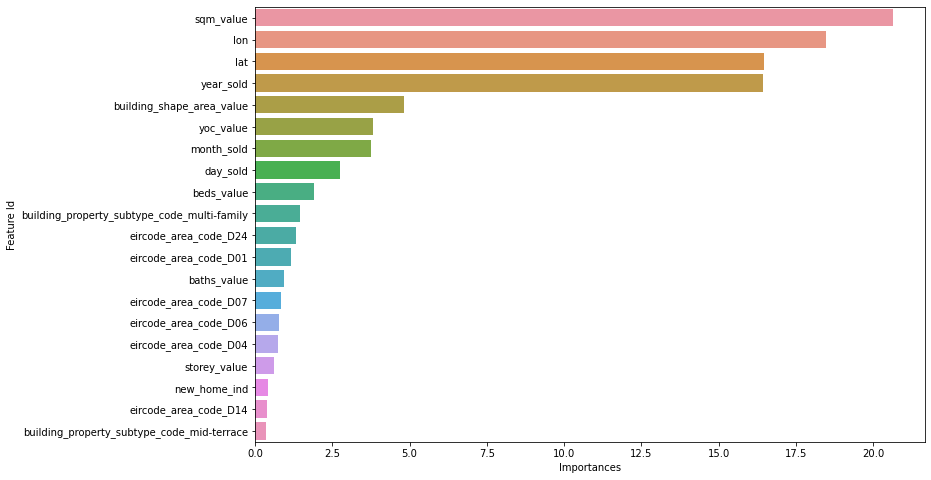

In [356]:
feat_imp = cat_f.get_feature_importance(prettified=True)
# Plotting top 20 features' importance

plt.figure(figsize = (12,8))
sns.barplot(x=feat_imp['Importances'][:20],y=feat_imp['Feature Id'][:20], orient = 'h')
plt.show()

In [357]:
final_scores = pd.DataFrame(list_baseline_models, columns = ['Regressors'])
final_scores['MdPE%'] = list_MdPE
final_scores['MdAPE%'] = list_MdAPE
final_scores['PPE05%'] = list_PPE05
final_scores['PPE10%'] = list_PPE10
final_scores['PPE20%'] = list_PPE20
final_scores['Outliers%'] = list_Outlier
final_scores['r2_scores'] = list_r2_score
final_scores['cv_r2_scores'] = list_cv_r2_score
final_scores['MPE%'] = list_MPE
final_scores['MAPE%'] = list_MAPE
final_scores['MSE'] = list_MSE
final_scores['RMSE'] = list_RMSE
final_scores['MAE%'] = list_MAE
final_scores['MdAE%'] = list_MdAE
final_scores['Train_R2'] = train_r2
final_scores = final_scores.sort_values(by = 'MdAPE%')
final_scores

,Regressors,MdPE%,MdAPE%,PPE05%,PPE10%,PPE20%,Outliers%,r2_scores,cv_r2_scores,MPE%,MAPE%,MSE,RMSE,MAE%,MdAE%,Train_R2
11,Hyper Cat Boost,-0.0129,1.0724,94.5285,99.3015,99.8836,0.1164,0.7456,0.7060,0.0871,1.6593,0.0977,0.3126,20.8608,13.8382,0.9612
9,Cat Boost Regressor,-0.0370,1.1034,94.8778,99.1851,99.8836,0.1164,0.7415,0.7213,0.0900,1.6723,0.0992,0.3150,21.0218,13.8473,0.9373
10,Stacked Regressor,0.0166,1.1406,94.2957,99.1851,99.8836,0.1164,0.7313,0.6997,0.0730,1.7206,0.1032,0.3212,21.6422,14.3474,0.9886
7,Light Gradient Boost Regressor,-0.0808,1.1791,94.4121,99.0687,99.8836,0.1164,0.7200,0.7061,0.0818,1.7309,0.1075,0.3278,21.7980,14.9469,0.9296
8,Gradient Boosting Regressor,-0.0848,1.2438,94.0629,99.1851,99.8836,0.1164,0.7112,0.7061,0.0744,1.7782,0.1109,0.3330,22.3839,15.7949,0.8038
4,XGBoost Regressor,-0.0635,1.2703,94.1793,99.4179,99.8836,0.1164,0.7126,0.6660,0.0688,1.7929,0.1103,0.3322,22.5437,16.1631,0.9903
3,RandomForest Regressor,-0.0576,1.2901,93.7136,99.1851,99.8836,0.1164,0.6985,0.6766,0.1018,1.8520,0.1158,0.3402,23.2822,16.6456,0.9564
1,Linear Regression,-0.0507,1.3043,93.3644,99.1851,99.8836,0.1164,0.6771,0.6828,0.0829,1.8723,0.1240,0.3521,23.5118,16.6570,0.6992
5,Support Vector Regressor,-0.0011,1.3284,92.7823,99.4179,99.8836,0.1164,0.6839,0.6775,0.1361,1.8812,0.1214,0.3484,23.6897,16.5948,0.7952
6,Bayesian Ridge Regression,-0.0730,1.3296,93.3644,99.1851,99.8836,0.1164,0.6798,0.6823,0.0827,1.8826,0.1229,0.3506,23.6388,16.8647,0.6981


In [358]:
fig = px.line(data_frame=final_scores, x=final_scores['Regressors'], 
             y=final_scores['MdPE%'], hover_data=['PPE05%','PPE10%','PPE20%','Outliers%'], color=px.Constant("MdPE%"),
             labels=dict(color="Percentage Errors"))

fig.add_bar( x=final_scores['Regressors'], 
             y=final_scores['MdAPE%'], name="MdAPE%")
fig.update_layout(title={'text': f"Comparison of MdAPE and MdPE values", 'x': 0.5, 
                         'xanchor': 'center', 'font': {'size': 20}})
fig.update_traces(marker_color='orange')
fig.show()

<ul>
    <li><p style="text-align:justify;"><b> MdPE = Bias - true accuracy of the statistical valuation method</b></p></li>
    <li><p style="text-align:justify;"><b> MdAPE = Dispersion - relative frequency of all different sizes of errors</b></p>
    </li>
    <li><p style="text-align:justify;"><b> PPE = Percentage Prediction Bands - tolerance threshold, for e.g. PPE10 means that how much percent of the percentage errors are less than 10(0.10) %</b></p>
    </li>

</ul>

In [359]:
final_scores.head(1)

,Regressors,MdPE%,MdAPE%,PPE05%,PPE10%,PPE20%,Outliers%,r2_scores,cv_r2_scores,MPE%,MAPE%,MSE,RMSE,MAE%,MdAE%,Train_R2
11,Hyper Cat Boost,-0.0129,1.0724,94.5285,99.3015,99.8836,0.1164,0.7456,0.706,0.0871,1.6593,0.0977,0.3126,20.8608,13.8382,0.9612


<p style="text-align:justify;"><b>
Hence, we see that Tuned Cat Boost is the best model which is giving us the desired metrics which are 
satisfying the Geowox accuracy results</b></p>

In [360]:
PE = ((y_pred - y_test ) / y_test) * 100 #Errors
print("MdPE% = ",np.median(PE))
print("MdAPE% = ",np.median(np.abs(PE)))
print("MeanPE% = ", np.mean(PE))
print("MeanAPE% = ", np.mean(np.abs(PE)))
print("PPE05% = ", PPE05(y_test, y_pred))
print("PPE10% = ", PPE10(y_test, y_pred))
print("PPE20% = ", PPE20(y_test, y_pred))
print("Outlier% = ",round(Outlier(y_test, y_pred),4))
print("Forecasted Standard Deviation = ", np.std(PE)) #Certainty

MdPE% =  -0.01293530122088496
MdAPE% =  1.0724132149535213
MeanPE% =  0.08705903155093875
MeanAPE% =  1.6593005367929716
PPE05% =  94.52852153667055
PPE10% =  99.30151338766007
PPE20% =  99.88358556461002
Outlier% =  0.1164
Forecasted Standard Deviation =  2.4960657877106684


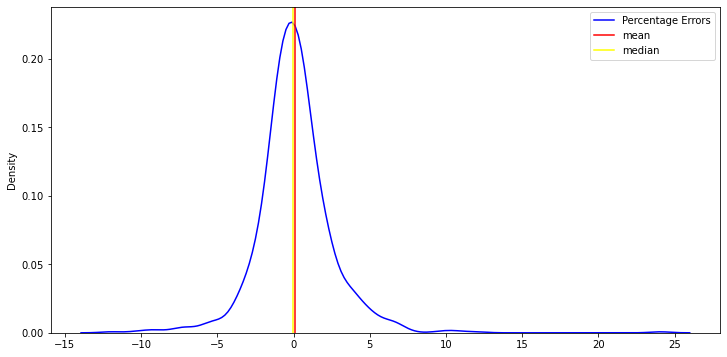

In [361]:
plt.figure(figsize = (12,6))
sns.kdeplot(PE, color="b", label="Percentage Errors")
plt.axvline(np.mean(PE), color='red', label="mean")
plt.axvline(np.median(PE), color='yellow', label ="median")
plt.legend()
plt.show()

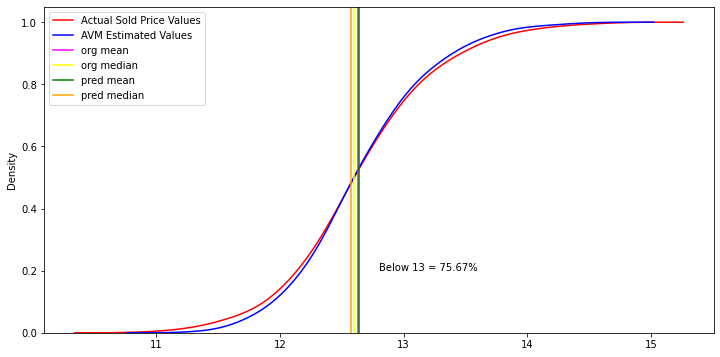

In [362]:
c =0
for i in y_test:
    if(i < 13):
        c=c+1
res = c/len(y_test) * 100

plt.figure(figsize = (12,6))
ax1 = sns.kdeplot(y_test, color="r", label="Actual Sold Price Values", cumulative=True)
sns.kdeplot(y_pred, color="b", label="AVM Estimated Values", ax=ax1, cumulative=True)
plt.text(12.8, 0.2, "Below 13 = %.2f" % res+"%")
plt.axvline(np.mean(y_test), color='magenta', label="org mean")
plt.axvline(np.median(y_test), color='yellow', label ="org median")
plt.axvline(np.mean(y_pred), color='green', label="pred mean")
plt.axvline(np.median(y_pred), color='orange', label ="pred median")
plt.legend()
plt.show()

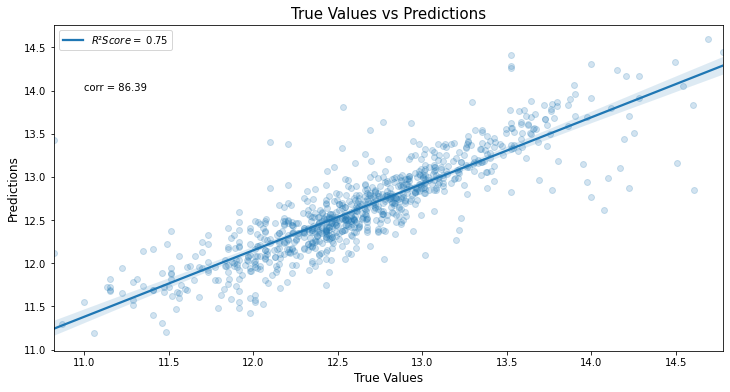

In [363]:
pears_corr = np.sum((y_pred-np.mean(y_pred)) * (y_test-np.mean(y_test))) / (np.sqrt(np.sum((y_pred - np.mean(y_pred))**2) * np.sum((y_test - np.mean(y_test))**2))) * 100
r2_value = r2_score(y_test, y_pred)
plt.figure(figsize = (12,6))
sns.regplot(x = y_test, y = y_pred, scatter_kws={'alpha':0.2})
plt.text(11, 14, r'corr = %.2f'% pears_corr)
plt.title('True Values vs Predictions', fontsize = 15)
plt.legend(['$R\u00b2 Score=$ {:.2f}'.format(r2_value)], loc = 'best')
plt.xlabel('True Values', fontsize=12)
plt.ylabel('Predictions', fontsize=12)
plt.show()

<img src="img2.jpg" width="500"/>

### Inference:
<ul>
    <li><p style="text-align:justify;"><b> Here, we again have a look at the AVM metrics along with the FSD which is nothing but the standard deviation of the percentage errors. It is also the precision of the model.</b></p></li>
    <li><p style="text-align:justify;"><b> Lower the FSD, higher is the confidence with which we can say that the AVM estimate is accurate.</b></p></li>
    <li><p style="text-align:justify;"><b> We divide the difference of estimated AVM and subsequent sales price with sales price because it is scale independent and allows comparisons across properties of different values. <a href="https://www.corelogic.com.au/sites/default/files/2018-03/20151028-CL-RP_AVM.pdf"> REFERENCE </a></b></p></li>
    <li><p style="text-align:justify;"><b> Bias can be quantified by the Average Error, but in
order to minimise the effect of a few potentially
spurious outliers, e.g. due to questionable Benchmark
Values, the more robust Median Error is usually
preferred <a href="file://C:/Users/PRASHANT/Downloads/EAA_Standards_2nd_Edition.pdf"> REFERENCE </a></b></p></li>
<li><p style="text-align:justify;"><b> Intuitively, FSDs tell us that if the error between
valuation and price varies significantly, then the AVM
does not perform consistently across the data being
evaluated and further investigation is required to
determine where the model is strong and where it is
weak with respect to a sample of properties. <a href="https://www.corelogic.com.au/sites/default/files/2018-03/20151028-CL-RP_AVM.pdf"> REFERENCE </a></b></p></li>
    <li><p style="text-align:justify;"><b>  If a standard deviation is
small, then two standard deviations is not going to be particularly big, and we can surmise that 95% of all percentage
errors are smaller than this number. i.e., accuracy error is
not a problem under these circumstances. <a href="https://www.corelogic.com.au/sites/default/files/2018-03/20151028-CL-RP_AVM.pdf"> REFERENCE </a></b></p></li>
    <li><p style="text-align:justify;"><b>
As a result, a positive percentage sales error means that the AVM has overvalued the target
    property, while a negative percent indicates undervaluation.</b> </p></li>
        <li><p style="text-align:justify;"><b>
From the distribution above, we can say that the percentage errors are normalized and thus reliable to consider accuracy and precision metrics.</b> <a href="https://github.com/markecker/Exposition-of-AVM-Performance-Metrics"> Exposition of AVM Performance Metrics
 </a></p></li>
    
   
    
    
    
</ul>

#### <center><h2> <font color='green'> Other metrics </font> </h2> </center>

In [365]:
#Horizontal Inequity = similar properties should have similar tax assessed values
# COV should be as low as possible.
ratio = y_pred / y_test
COV = np.std(ratio)/ np.mean(ratio)
unbiasedCOV = COV*(1+1/(4*859))
print("Coefficient of Variation COV = ", COV)
print("Unbiased Coefficient of Variation COV = ", unbiasedCOV)

Coefficient of Variation COV =  0.024938946272003267
Unbiased Coefficient of Variation COV =  0.024946204405376957


In [366]:
# COD is a measure of the (horizontal) dispersion of these ratios about the median. It is "variability statistic of choice".
# COD should fall between 5 and 20 for residential properties

ratio = np.exp2(y_pred)/np.exp2(y_test)
sums = np.absolute((ratio) - np.median(ratio))
mean = np.sum(sums) / len(y_pred)
COD = (mean/np.median(ratio)) * 100
COD

15.147065513020836

In [367]:
# Vertical Inequity = higher valued properties should bear higher tax burdens. It is the index statistic measurement.
#Price-Related Differential PRD (Regressivity) <= 1.03 or >= 0.98 (Progressivity)
# PRD is biased upwards towards Regressivity & highly affected by outliers and heteroscedasticity.
mp = np.mean(y_pred)
mt = np.mean(y_test)

meanratio = np.mean(y_pred / y_test)

PRD = (meanratio * mt)/mp
PRD

1.0005566361070124

In [368]:
# Price-Related Bias (PRB) should fall between+/- 0.05.
# (-) = Regressivity - undervaluation of high valued properties
# (+) = Progressivity - undervaluation of low valued properties
ratio = np.exp(y_pred)/np.exp(y_test)
avm_by_medratio = np.exp(y_pred)/ np.median(ratio)
val = (avm_by_medratio + np.exp(y_test))/2
X = np.log(val)/0.693
Y = (ratio - np.median(ratio))/np.median(ratio)

corr = np.sum((X-np.mean(X)) * (Y-np.mean(Y))) / (np.sqrt(np.sum((X - np.mean(X))**2) * np.sum((Y - np.mean(Y))**2)))
PRB = corr/(np.std(X) * np.std(Y))
PRB 
# which indicates significant vertical inequity.

-0.2254935291968088

<p style="text-align:justify;"><h3>
AVM estimates are more
likely to accurately reflect sales price if:     <a href="https://www.corelogic.com.au/sites/default/files/2018-03/20151028-CL-RP_AVM.pdf">REFERENCE</a></h3></p>
<ul> 
<li><p style="text-align:justify;"><b> There is sufficient volume of “similar” properties in the
given segment.</b></p></li>
    <li><p style="text-align:justify;"><b> The model is current and was trained on a relevant
sample.</b></p></li>
    <li><p style="text-align:justify;"><b> The market is not moving rapidly. </b></p></li>

</ul>

#### <center><h2> <font color='green'> Schematic Overview of Statistical Valuation Models </font> </h2> </center>

![Schematic Overview of Statistical Valuation Models](img1.png "Schematic Overview of Statistical Valuation Models")

#### <center><h2> <font color='green'> Data Summary and suggestions for future work</font> </h2> </center>

### <u style="color: darkblue;"> Summary: </u>

<ul>
    <li><p style="text-align:justify;"><b> After the detail Data Analysis with the help of Statistical graphs as well as descriptive graphs, we have seen significant insights which are displayed after every graph.</b></p></li>
    <li><p style="text-align:justify;"><b> We followed a traditional ML pipeline, wherein firstly we did Exploratory Data Analysis, then going towards Feature Engineering and Selection and finally ML modelling and comparison of scores in the end.</b></p></li>
    <li><p style="text-align:justify;"><b> We trained and tested around more than 10 Regression models and found out that Cat Boost is the best algorithm with less MdPE and MdAPE percentages. </b></p></li>
    <li><p style="text-align:justify;"><b> We further tuned the Cat Boost Algo and found out that the tuned Cat Boost is outperforming each and every other algorithm, it is also satisfying and beating the given accuracy results. </b></p></li>
    <li><p style="text-align:justify;"><b> When we get the feature importances from the cat boost model, we see that the "sqm_value" is the most important feature. We also see that surprisingly, lat and lon are also important features, even though we didn't discretize them.</b></p></li>
    <li><p style="text-align:justify;"><b> The price of the properties in Dublin have increased tremendously over the timespan from 2010 to 2019.</b></p></li>
    <li><p style="text-align:justify;"><b> The new homes in dublins are more expensive than the old homes which is evident from the median sold price.</b></p></li>
    <li><p style="text-align:justify;"><b> As the storey value increases, the price of the property increases.</b></p></li>
    <li><p style="text-align:justify;"><b> Properties with 1 to 5 bedrooms have an exponential increase in prices, but as soon as the bedroom value goes to 6 to 9, there is a drastic decrease in the sold price. Similar is with the bathrooms.</b></p></li>
    <li><p style="text-align:justify;"><b> The sq. meter of a property is highly correlated with the sold price of the property and this is also evident from the scatter graph.</b></p></li>
<li><p style="text-align:justify;"><b> In a falling market when risks are
greatest, a model is more likely to lag the trend than lead
it, resulting in over-pricing.<a href="https://www.corelogic.com.au/sites/default/files/2018-03/20151028-CL-RP_AVM.pdf"> REFERENCE </a></b></p></li>
    
    
</ul>

### <u style="color: darkblue;"> Future Work: </u>

<ul>
    <li><p style="text-align:justify;"><b> There are a lot of things which can be implemented and manipulated apart from the comprehensive analysis and ML modelling which we have seen above.</b></p></li>
        <li><p style="text-align:justify;"><b> We can use different state of the art Deep Learning algorithms for the house price prediction.</b></p></li>
     <li><p style="text-align:justify;"><b> Tabular learning which is unorthodox and new in the market is also proven significantly faster than ML algorithms in Regression problems.</b></p></li>
    <li><p style="text-align:justify;"><b> TabNet is a Deep Neural Network for tabular data and was designed to learn in a similar way than decision tree based models, in order to have their benefits : interpretability and sparse feature selection. TabNet uses sequential attention to choose which features to reason from at each decision step, enabling interpretability and better learning (as the learning capacity is used for the most salient/important features). The feature selection is instancewise, so it can be different for each input. <a href="https://arxiv.org/abs/1908.07442"> REFERENCE </a></b></p></li>
        <li><p style="text-align:justify;"><b> The features given in the dataset are too less as compared to other Kaggle competition datasets for regression.</b></p></li>
     <li><p style="text-align:justify;"><b> If we could scrape more features from some irish govt, or estate agency website to get features like the universities near the properties and the affected sold price. Which is evident in the southern part of dublin. </b></p></li>
    <li><p style="text-align:justify;"><b> By scraping, we could also find no. of grocery supermarkets like Tesco, Lidl and Aldi nearby a property affecting the price of the property. Bus stops, Luas and dart stations, recreational and entertainment parks near a specific property can also rigorously affect the price of the property, which we can consider in the future work of predicting housing prices without abruption. </b></p></li>
    <li><p style="text-align:justify;"><b> We can try using different feature selection for different models: i.e. only dropping features for linear models, but not for tree-based non-linear models</b></p></li>
    <li><p style="text-align:justify;"><b> We can also try more preprocessing choices as BoxCox transformation, PCA, etc. For PCA, we may use the cross-correlation result among all the numerical variables, as shown earlier, to find highly correlated groups of variables, and only PCA on them and see.</b></p></li>
    <li><p style="text-align:justify;"><b> We can find some more robust way to deal with outliers, but there should obviously be more data(rows) to the dataset to nullify the outliers, else we tend to lose more data.</b></p></li>
    <li><p style="text-align:justify;"><b> We can cluster the lat lon accordingly and generate new useful categorical features.</b></p></li>
   <li><p style="text-align:justify;"><b> We can also use the Stacking strategy famous on kaggle for house price prediction and chose to stack the best tuned models altogether. <a href="https://www.kaggle.com/serigne/stacked-regressions-top-4-on-leaderboard"> REFERENCE </a></b></p></li>
       <li><p style="text-align:justify;"><b> Instead of choosing the best model from the base models for hyperparameter tuning, we can tune each and every algorithm and compare them separately by using Voting Regressor or other ensembling technique.</b></p></li>
    
</ul>